<a href="https://colab.research.google.com/github/Technocolabs100/Prediction-of-Corporate-Bankruptcy/blob/habiba_yasser_branch/merged_files_EDA_%26_Feature_Engineering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import SelectKBest, mutual_info_classif

In [3]:
# Read the individual CSV files into separate DataFrames
df1 = pd.read_csv("C:/Users/XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_1.csv")
df2 = pd.read_csv("C:/Users\XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_2.csv")
df3 = pd.read_csv('C:/Users\XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_3.csv')
df4 = pd.read_csv('C:/Users\XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_4.csv')
df5 = pd.read_csv('C:/Users/XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_5.csv')

# Concatenate the DataFrames vertically to merge them
merged_df = pd.concat([df1, df2, df3, df4, df5], ignore_index=True)

# Save the merged DataFrame to a new CSV file
merged_df.to_csv('merged_data.csv', index=False)

In [4]:
# Read the individual CSV files into separate DataFrames
df1 = pd.read_csv("C:/Users/XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_1.csv")
df2 = pd.read_csv("C:/Users\XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_2.csv")
df3 = pd.read_csv('C:/Users\XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_3.csv')
df4 = pd.read_csv('C:/Users\XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_4.csv')
df5 = pd.read_csv('C:/Users/XGBoost/Prediction-of-Corporate-Bankruptcy-habiba_yasser_branch/data_file_5.csv')
# Concatenate the DataFrames vertically to merge them
merged_df = pd.concat([df1, df2, df3, df4, df5], axis=0, ignore_index=True)

# Save the merged DataFrame to a new CSV file
merged_df.to_csv('merged_data.csv', index=False)

In [5]:
merged_df.shape

(40768, 65)

In [6]:
merged_df.head()

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,[(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation)] 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs /total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities *365) / sales,sales / short-term liabilities,sales / fixed assets,Classification
0,0.200550,0.37951,0.39641,2.0472,32.3510,0.38825,0.249760,1.33050,1.1389,0.50494,...,0.121960,0.39718,0.87804,0.001924,8.4160,5.1372,82.658,4.4158,7.4277,0
1,0.209120,0.49988,0.47225,1.9447,14.7860,0.00000,0.258340,0.99601,1.6996,0.49788,...,0.121300,0.42002,0.85300,0.000000,4.1486,3.2732,107.350,3.4000,60.9870,0
2,0.248660,0.69592,0.26713,1.5548,-1.1523,0.00000,0.309060,0.43695,1.3090,0.30408,...,0.241140,0.81774,0.76599,0.694840,4.9909,3.9510,134.270,2.7185,5.2078,0
3,0.081483,0.30734,0.45879,2.4928,51.9520,0.14988,0.092704,1.86610,1.0571,0.57353,...,0.054015,0.14207,0.94598,0.000000,4.5746,3.6147,86.435,4.2228,5.5497,0
4,0.187320,0.61323,0.22960,1.4063,-7.3128,0.18732,0.187320,0.63070,1.1559,0.38677,...,0.134850,0.48431,0.86515,0.124440,6.3985,4.3158,127.210,2.8692,7.8980,0


Check for duplicates

In [7]:
# Check for duplicates
duplicates = merged_df.duplicated()

# Count the number of duplicates
num_duplicates = duplicates.sum()

# Display the result
print(f"Number of duplicates: {num_duplicates}")
print("Duplicate rows:")
print(merged_df[duplicates])

Number of duplicates: 0
Duplicate rows:
Empty DataFrame
Columns: [net profit / total assets, total liabilities / total assets, working capital / total assets, current assets / short-term liabilities, [(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation)] 365, retained earnings / total assets, EBIT / total assets, book value of equity / total liabilities, sales / total assets, equity / total assets, (gross profit + extraordinary items + financial expenses) / total assets, gross profit / short-term liabilities, (gross profit + depreciation) / sales, (gross profit + interest) / total assets, (total liabilities 365) / (gross profit + depreciation), (gross profit + depreciation) / total liabilities, total assets / total liabilities, gross profit / total assets, gross profit / sales, (inventory 365) / sales, sales (n) / sales (n-1), profit on operating activities / total assets, net profit / sales, gross profit (in 3 years) / total asset

**Performing the EDA in the univariate, bi-variate and multi-variate manner**

Check what columns are correlated

Searched about bankruptcy and found out an equation called **'the Altman Z-Score' **

Altman Z-Score = 1.2A + 1.4B + 3.3C + 0.6D + 1.0E
A = working capital / total assets

*   A = working capital / total assets
*   B = retained earnings / total assets
*   C = earnings before interest and tax / total assets
*   D = book value of equity / total liabilities
*   E = sales / total assets

A score below 1.8 means it's likely the company is headed for bankruptcy, while companies with scores above 3 are not likely to go bankrupt.

Check for Correlation

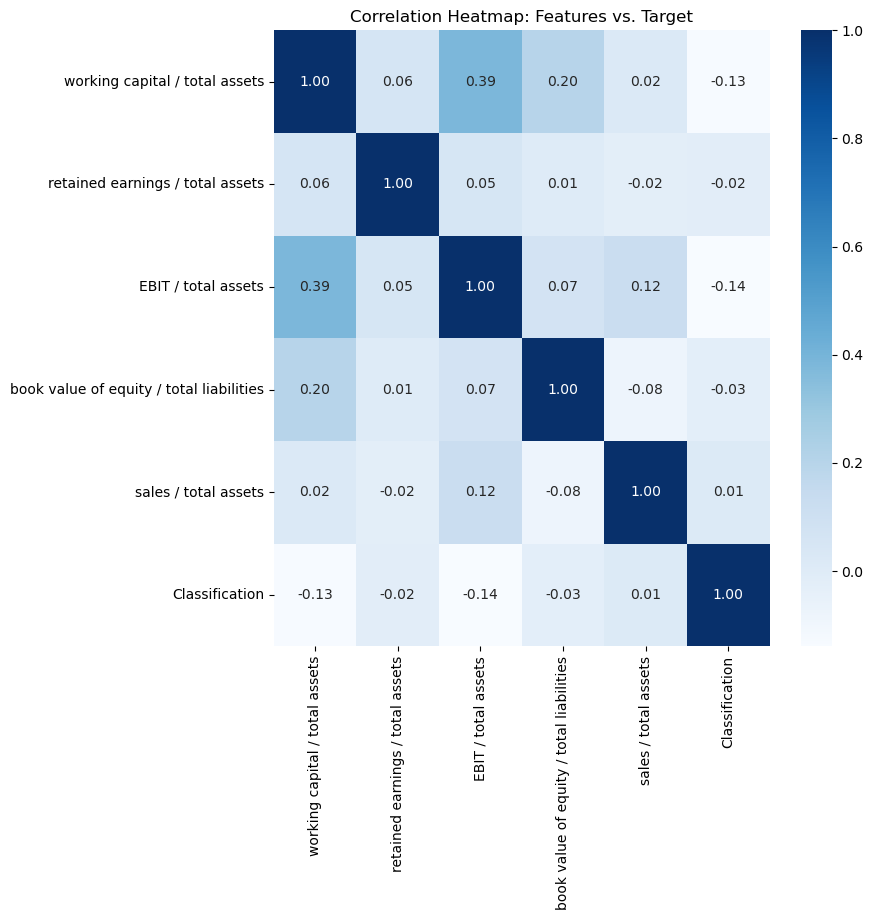

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with columns 'feature1', 'feature2', ..., 'featureN', and 'target'

# Select the columns of interest (features and target)
features = ['working capital / total assets', 'retained earnings / total assets', 'EBIT / total assets', 'book value of equity / total liabilities', 'sales / total assets']  # Add more feature columns as needed
target = 'Classification'

# Create a new DataFrame with only the selected columns
data_subset = merged_df[features + [target]]

# Calculate the correlation matrix
correlation_matrix = data_subset.corr()

# Create a heatmap for the correlation matrix
plt.figure(figsize=(8, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f")
plt.title("Correlation Heatmap: Features vs. Target")
plt.show()


Correlation values varies from -1 to 1


*   -1: Negative Correalation meaning inversely proportional
*   +1: Positive Correlation meaning directly proportional
*   0: NO CORRELATION

As shown from the heatmap, the 5 selected columns have a correlation eith the target variable which is the 'Classification' column. This is the target variable as there are no missing values in that column also the values in the column is binary either 0 or 1

Since we have 65 columns, i figured out that eliminating 60 columns will not be a good idea so I will use a threshold value for correlation and keep all columns above this values instead of the equation mentioned above

In [9]:
# By using this function we can select correlated features
# it will remove the first feature that is correlated with anything other feature
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [10]:
len(correlation(merged_df,0.8))

27

In [11]:
correlation(merged_df,0.8)

{'(current assets - inventory - receivables) / short-term liabilities',
 '(current assets - inventory) / short-term liabilities',
 '(gross profit + interest) / sales',
 '(gross profit + interest) / total assets',
 '(net profit + depreciation) / total liabilities',
 '(receivables\xa0365) / sales',
 '(sales - cost of products sold) / sales',
 '(short-term liabilities\xa0365) / cost of products sold)',
 'EBIT / total assets',
 'EBITDA (profit on operating activities - depreciation) / sales',
 'constant capital / fixed assets',
 'constant capital / total assets',
 'current assets / total liabilities',
 'equity / fixed assets',
 'equity / total assets',
 'gross profit (in 3 years) / total assets',
 'gross profit / sales',
 'gross profit / total assets',
 'net profit / sales',
 'profit on operating activities / sales',
 'profit on operating activities / total assets',
 'profit on sales / total assets',
 'sales / fixed assets',
 'sales / short-term liabilities',
 'short-term liabilities / tot

In [12]:
correlated_features = correlation(merged_df, 0.8)
filtered_data = merged_df[list(correlated_features)]

In [13]:
filtered_data

,(gross profit + interest) / sales,gross profit / sales,profit on sales / total assets,(current assets - inventory - receivables) / short-term liabilities,EBITDA (profit on operating activities - depreciation) / sales,(gross profit + interest) / total assets,net profit / sales,(net profit + depreciation) / total liabilities,current assets / total liabilities,sales / short-term liabilities,...,(sales - cost of products sold) / sales,profit on operating activities / total assets,total assets / total liabilities,constant capital / fixed assets,equity / total assets,profit on operating activities / sales,constant capital / total assets,sales / fixed assets,gross profit / total assets,equity / fixed assets
0,0.149420,0.149420,0.214020,0.662950,0.110850,0.249760,0.119980,0.604110,2.04200,4.4158,...,0.121960,0.214020,2.6349,2.24800,0.504940,0.128040,0.50591,7.42770,0.249760,2.243700
1,0.152000,0.152000,0.206160,0.086422,0.139610,0.258340,0.123040,0.439920,1.94470,3.4000,...,0.121300,0.248060,2.0005,17.86600,0.497880,0.145950,0.49788,60.98700,0.258340,17.866000
2,0.238150,0.236100,0.315650,0.322020,0.222930,0.309060,0.189960,0.372820,1.07580,2.7185,...,0.241140,0.302600,1.4369,2.05040,0.304080,0.231170,0.51537,5.20780,0.309060,1.209800
3,0.071428,0.071428,0.115500,0.401390,0.066165,0.092704,0.062782,0.361520,2.49280,4.2228,...,0.054015,0.115500,3.2537,2.45240,0.573530,0.088995,0.57353,5.54970,0.092704,2.452400
4,0.115530,0.115530,0.198320,0.293040,0.116010,0.187320,0.115530,0.322110,1.29590,2.8692,...,0.134850,0.198320,1.6307,2.11840,0.386770,0.122310,0.43489,7.89800,0.187320,1.883900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40763,-0.175650,-0.203240,-0.235400,0.016216,-0.193090,-0.283380,-0.203240,-0.289770,0.23663,3.9105,...,0.032555,-0.269220,1.0226,0.74181,0.022018,-0.193090,0.57010,1.81430,-0.283380,0.028649
40764,0.024762,0.008338,0.033819,0.022858,0.008809,0.013981,0.007692,0.054556,0.37454,7.4313,...,0.020169,0.040401,1.4160,0.90248,0.293790,0.024093,0.66377,2.27990,0.013981,0.399440
40765,-0.133990,-0.133990,-0.534920,0.024771,-0.147760,-0.578050,-0.133990,-0.491730,0.16455,4.4940,...,-0.064073,-0.534920,1.0341,-0.45546,-0.390040,-0.123990,-0.38299,5.13050,-0.578050,-0.463850
40766,-0.141280,-0.141280,-0.099950,0.048976,-0.204970,-0.109180,-0.140860,-0.067762,0.25733,4.3911,...,-0.183200,-0.099950,1.3442,0.81772,0.093224,-0.129340,0.66118,0.95575,-0.109180,0.115300


In [14]:
def correlation(dataset, target, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()

    # Calculate correlations with the target variable
    target_correlations = abs(corr_matrix[target])
    col_corr.update(target_correlations[target_correlations > threshold].index)

    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)

    # Remove the target variable from the correlated columns set
    col_corr.discard(target)

    return col_corr

# Example usage:
# Assuming you have a DataFrame called 'df' with features and a target variable 'target'
# Set the threshold (e.g., 0.7) as desired
correlated_features_with_target = correlation(merged_df, 'Classification', threshold=0.8)
print(len(correlated_features_with_target))




27


In [15]:
filtered_columns = filtered_data.columns
print(filtered_columns)

Index(['(gross profit + interest) / sales', 'gross profit / sales',
       'profit on sales / total assets',
       '(current assets - inventory - receivables) / short-term liabilities',
       'EBITDA (profit on operating activities - depreciation) / sales',
       '(gross profit + interest) / total assets', 'net profit / sales',
       '(net profit + depreciation) / total liabilities',
       'current assets / total liabilities', 'sales / short-term liabilities',
       '(short-term liabilities 365) / cost of products sold)',
       '(current assets - inventory) / short-term liabilities',
       '(receivables 365) / sales', 'total sales / total assets',
       'gross profit (in 3 years) / total assets',
       'short-term liabilities / total assets', 'EBIT / total assets',
       '(sales - cost of products sold) / sales',
       'profit on operating activities / total assets',
       'total assets / total liabilities', 'constant capital / fixed assets',
       'equity / total assets'

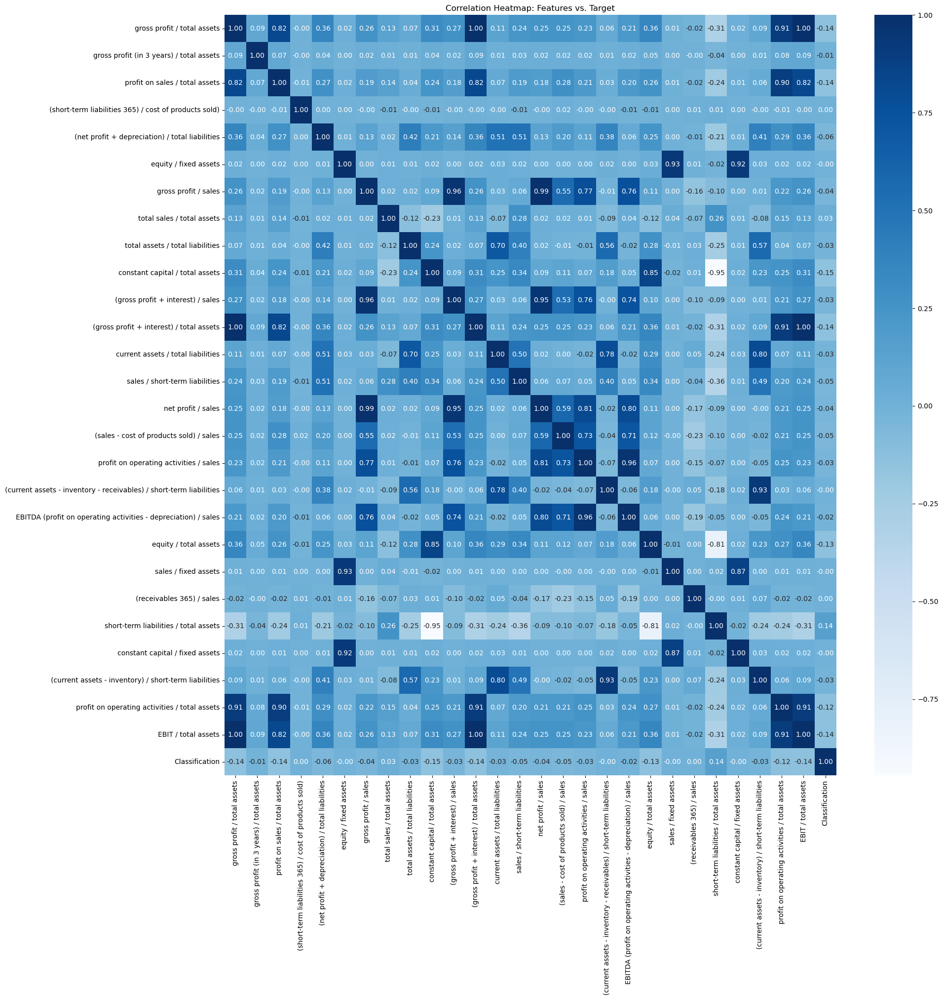

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with columns 'feature1', 'feature2', ..., 'featureN', and 'target'

# Select the columns of interest (features and target)
features = ['gross profit / total assets',
       'gross profit (in 3 years) / total assets',
       'profit on sales / total assets',
       '(short-term liabilities 365) / cost of products sold)',
       '(net profit + depreciation) / total liabilities',
       'equity / fixed assets', 'gross profit / sales',
       'total sales / total assets', 'total assets / total liabilities',
       'constant capital / total assets', '(gross profit + interest) / sales',
       '(gross profit + interest) / total assets',
       'current assets / total liabilities', 'sales / short-term liabilities',
       'net profit / sales', '(sales - cost of products sold) / sales',
       'profit on operating activities / sales',
       '(current assets - inventory - receivables) / short-term liabilities',
       'EBITDA (profit on operating activities - depreciation) / sales',
       'equity / total assets', 'sales / fixed assets',
       '(receivables 365) / sales', 'short-term liabilities / total assets',
       'constant capital / fixed assets',
       '(current assets - inventory) / short-term liabilities',
       'profit on operating activities / total assets', 'EBIT / total assets'] # Add more feature columns as needed
target = 'Classification'

# Create a new DataFrame with only the selected columns
data_subset = merged_df[features + [target]]

# Calculate the correlation matrix
correlation_matrix = data_subset.corr()

# Create a heatmap for the correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f")
plt.title("Correlation Heatmap: Features vs. Target")
plt.show()



From the 27 column, No column exceeds 0.2 correlation value which means that there is some kind of mistake in the dataset

**Univariate Analysis**

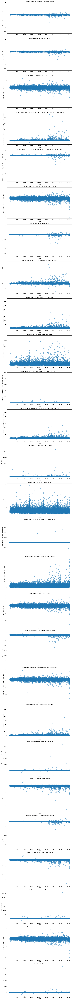

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with the columns for analysis
# Replace 'df' with the actual DataFrame you want to analyze

# Calculate the number of rows and columns for the subplots grid
num_rows = len(filtered_data.columns)
num_cols = 1

# Create subplots with the specified grid layout
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5*num_rows))

# Loop through each column and plot its scatter plot on the corresponding subplot
for i, col in enumerate(filtered_data.columns):
    ax = axes[i] if num_rows > 1 else axes  # Handle the case of a single row of subplots
    ax.scatter(filtered_data.index, filtered_data[col], alpha=0.5)
    ax.set_xlabel("Index")
    ax.set_ylabel(col)
    ax.set_title(f"Scatter plot of {col}")

# Adjust the layout and spacing of subplots
plt.tight_layout()

# Show the subplots
plt.show()


Linear Plots

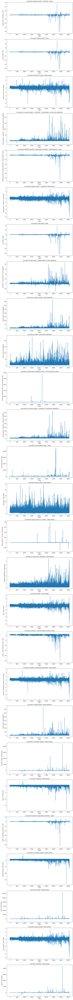

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with the columns for analysis
# Replace 'df' with the actual DataFrame you want to analyze

# Calculate the number of rows and columns for the subplots grid
num_rows = len(filtered_data.columns)
num_cols = 1

# Create subplots with the specified grid layout
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5*num_rows))

# Loop through each column and plot its line plot on the corresponding subplot
for i, col in enumerate(filtered_data.columns):
    ax = axes[i] if num_rows > 1 else axes  # Handle the case of a single row of subplots
    ax.plot(filtered_data.index, filtered_data[col])
    ax.set_xlabel("Index")
    ax.set_ylabel(col)
    ax.set_title(f"Line plot of {col}")

# Adjust the layout and spacing of subplots
plt.tight_layout()

# Show the subplots
plt.show()


In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Histograms, box plots and KDE

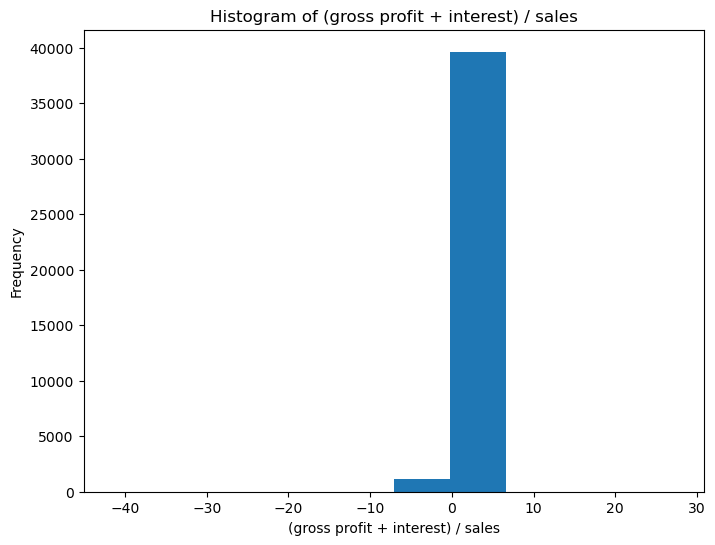

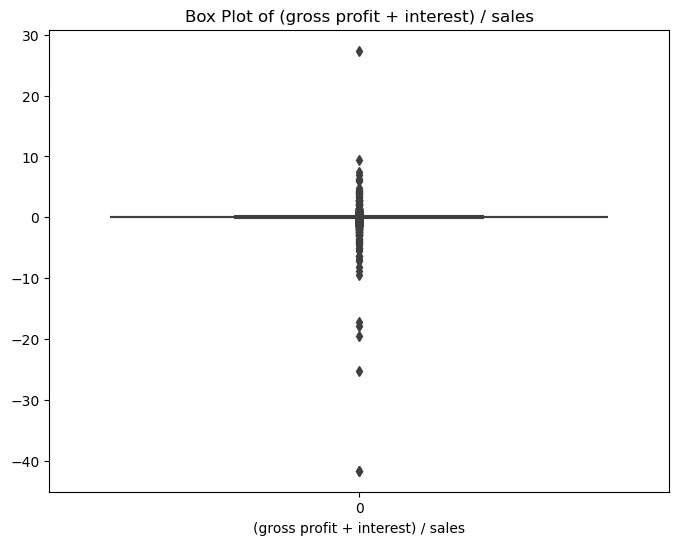

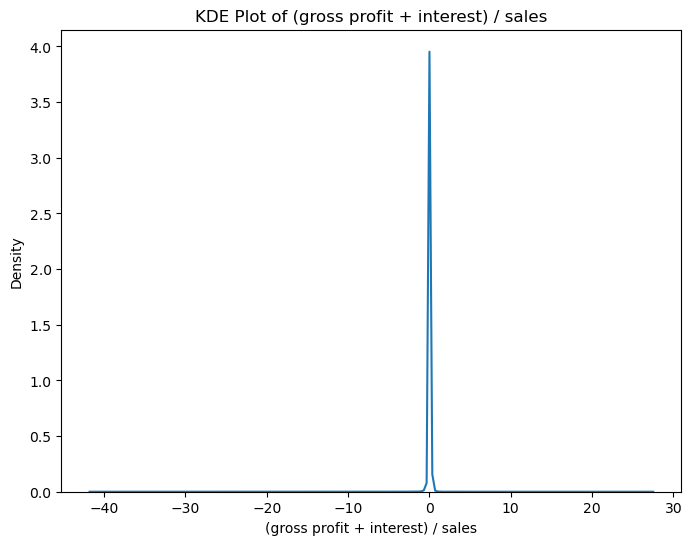

Summary statistics for (gross profit + interest) / sales:
count    40768.000000
mean         0.043431
std          0.444659
min        -41.617000
25%          0.007908
50%          0.042649
75%          0.098365
max         27.356000
Name: (gross profit + interest) / sales, dtype: float64



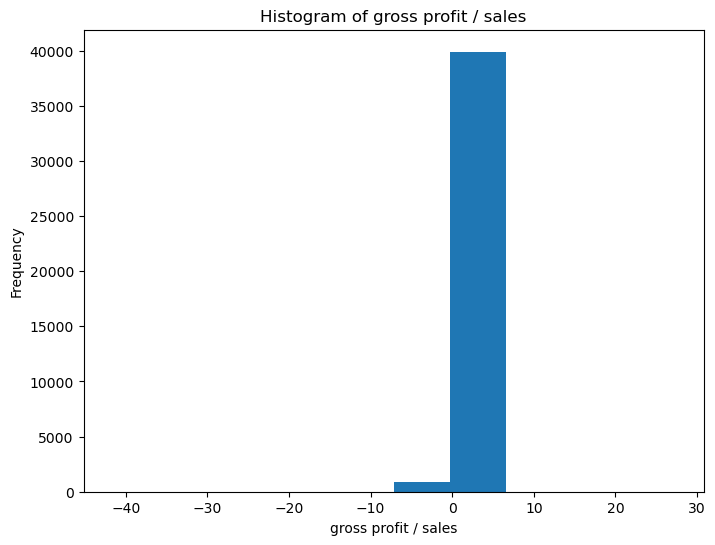

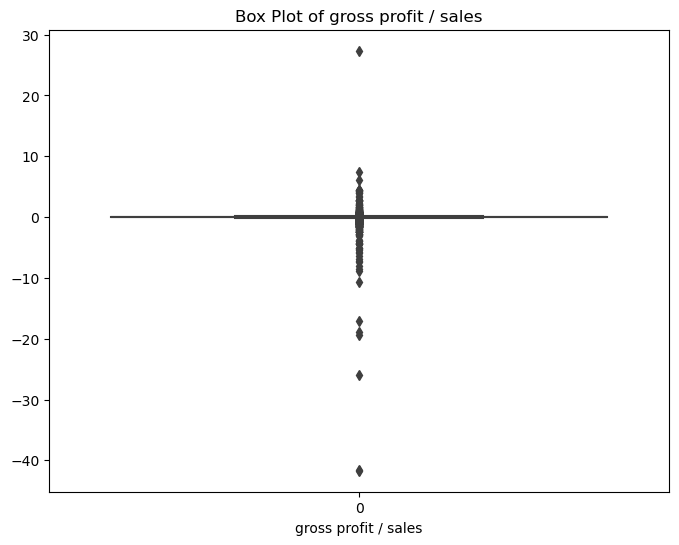

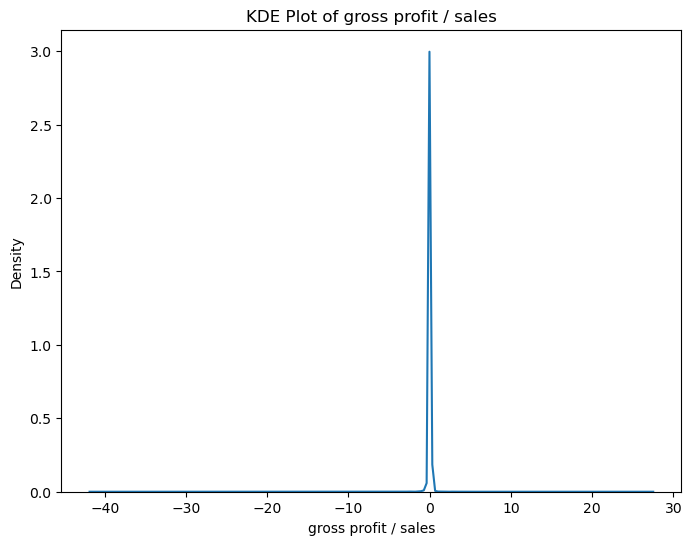

Summary statistics for gross profit / sales:
count    40768.000000
mean         0.033118
std          0.442454
min        -41.711000
25%          0.004485
50%          0.035394
75%          0.087934
max         27.356000
Name: gross profit / sales, dtype: float64



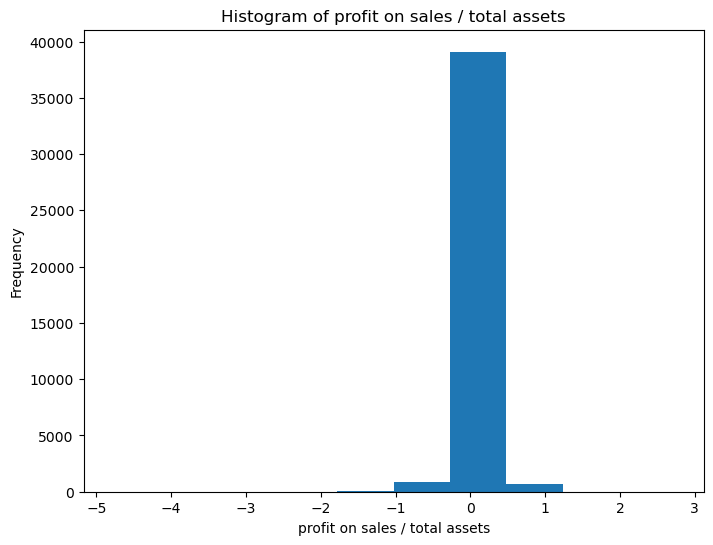

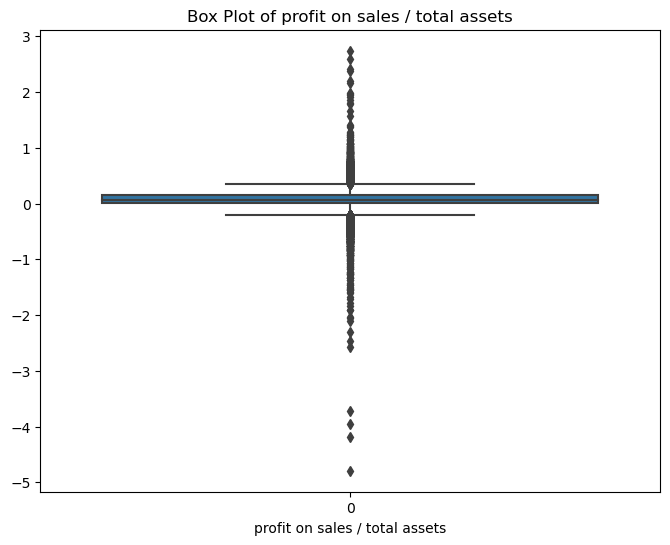

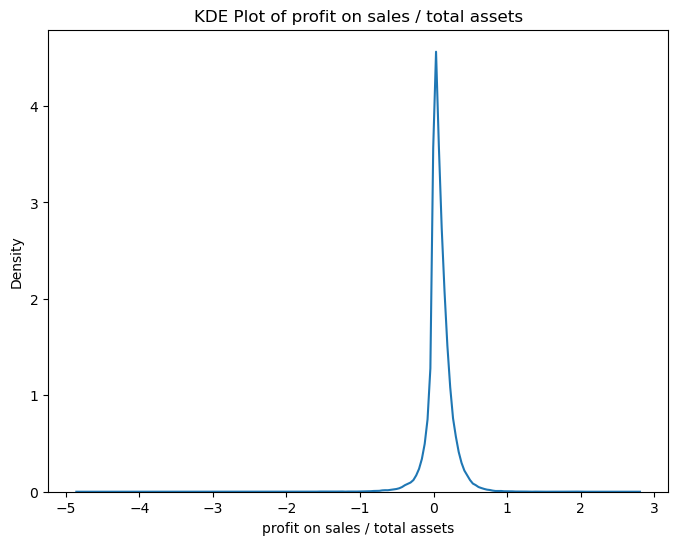

Summary statistics for profit on sales / total assets:
count    40768.000000
mean         0.078413
std          0.180547
min         -4.792200
25%          0.007487
50%          0.061565
75%          0.147870
max          2.742000
Name: profit on sales / total assets, dtype: float64



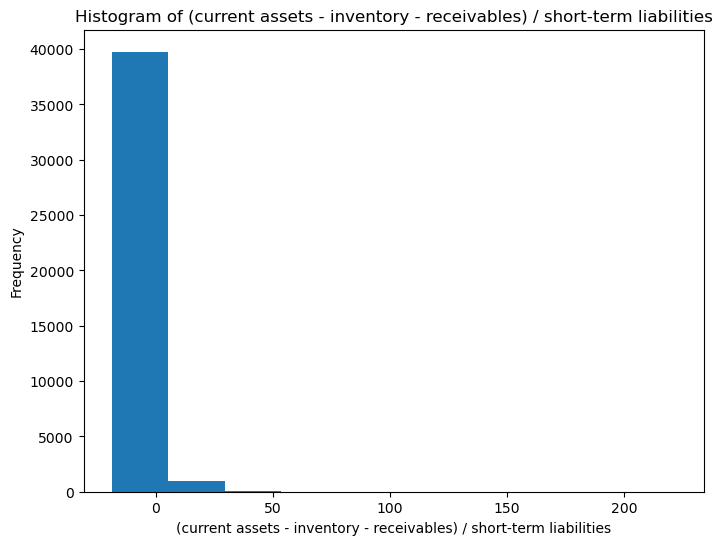

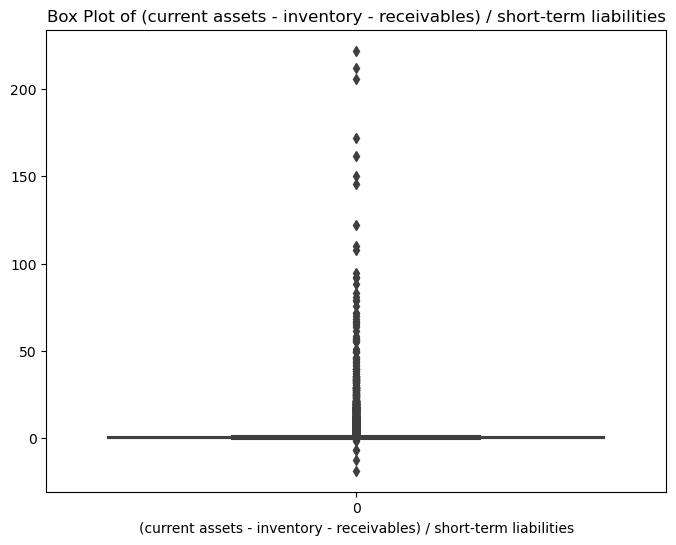

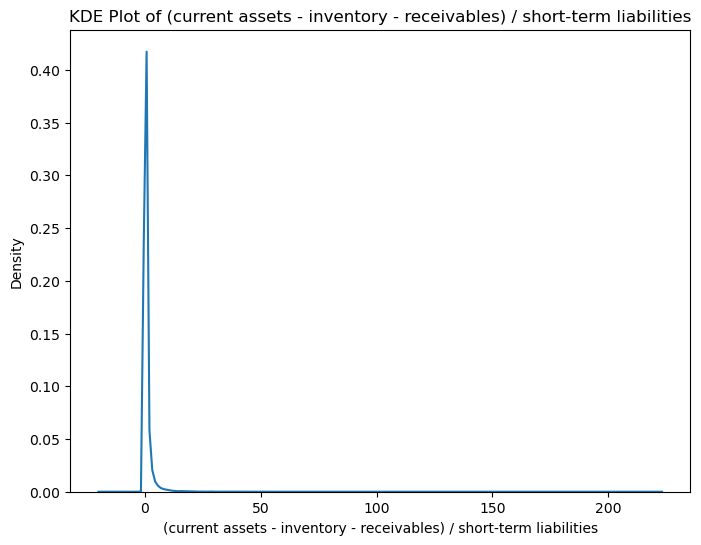

Summary statistics for (current assets - inventory - receivables) / short-term liabilities:
count    40768.000000
mean         0.836505
std          3.825658
min        -18.718000
25%          0.052487
50%          0.171460
75%          0.608325
max        221.960000
Name: (current assets - inventory - receivables) / short-term liabilities, dtype: float64



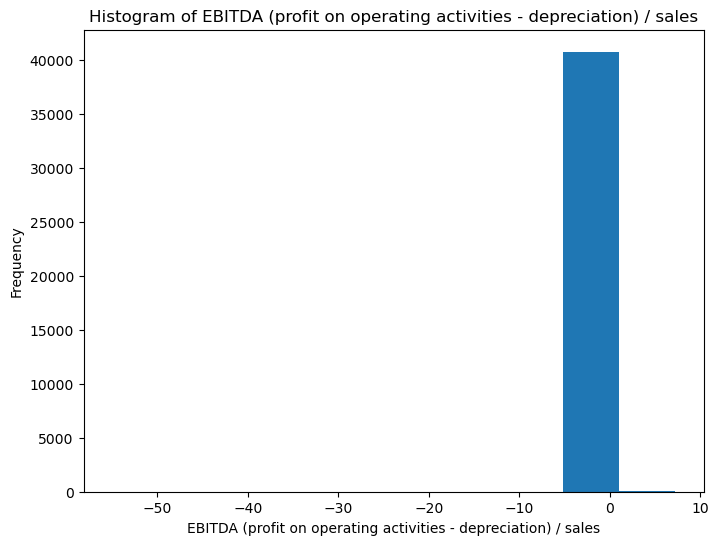

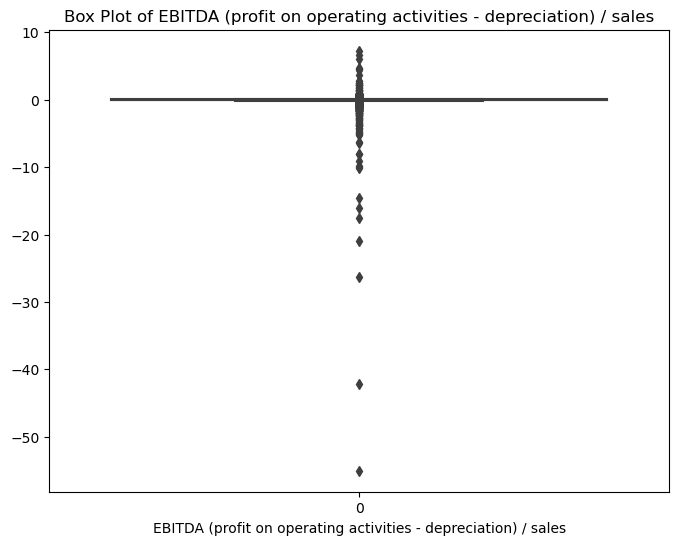

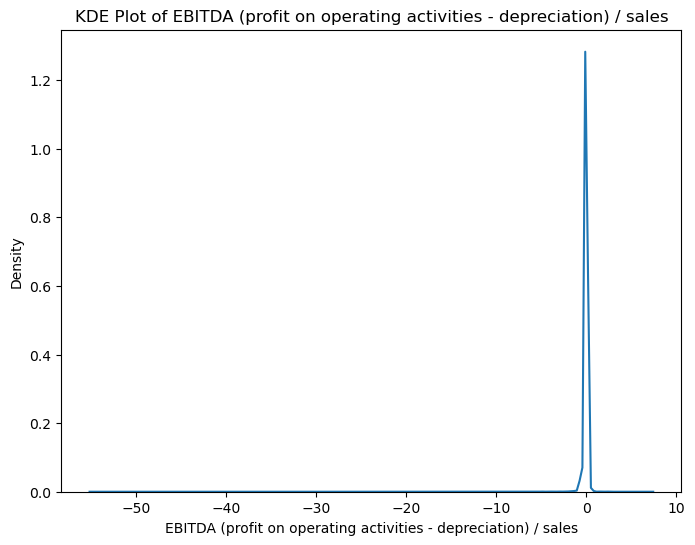

Summary statistics for EBITDA (profit on operating activities - depreciation) / sales:
count    40768.000000
mean        -0.005357
std          0.469014
min        -55.041000
25%         -0.024399
50%          0.011253
75%          0.060217
max          7.276400
Name: EBITDA (profit on operating activities - depreciation) / sales, dtype: float64



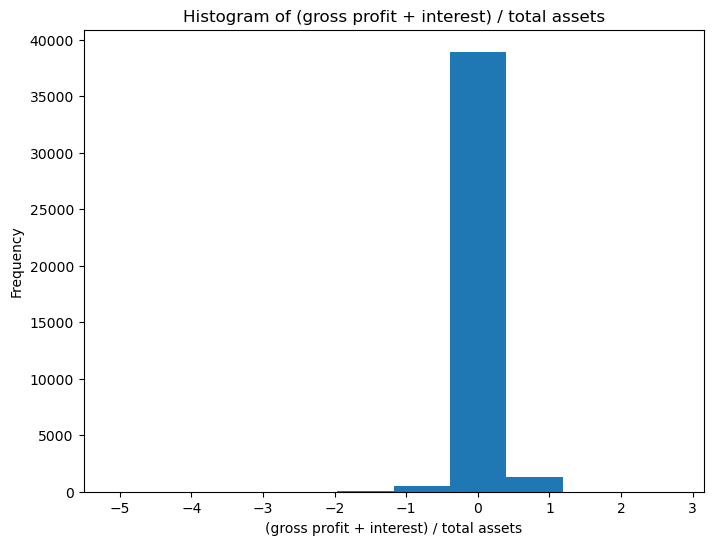

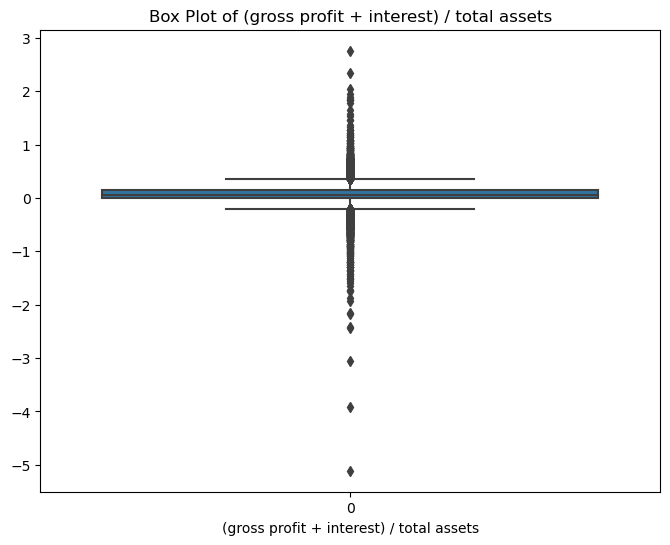

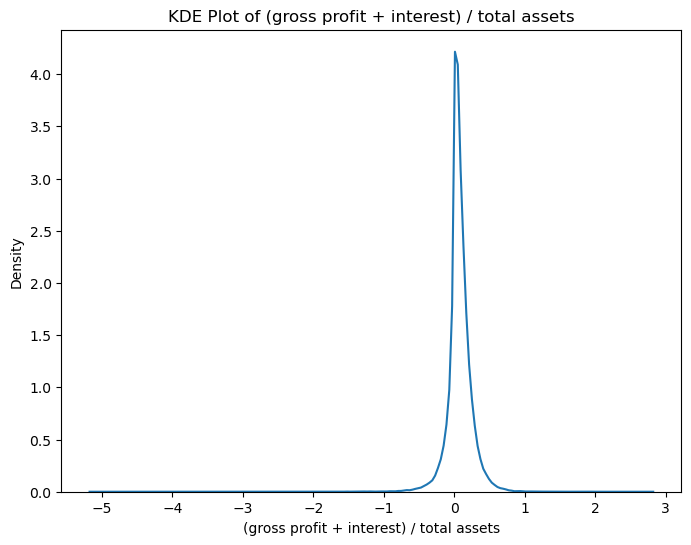

Summary statistics for (gross profit + interest) / total assets:
count    40768.000000
mean         0.074217
std          0.178482
min         -5.112000
25%          0.006902
50%          0.059709
75%          0.147473
max          2.761400
Name: (gross profit + interest) / total assets, dtype: float64



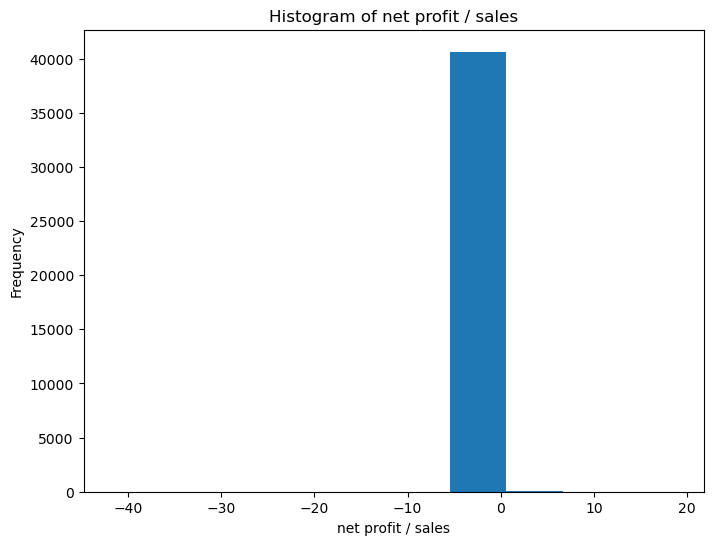

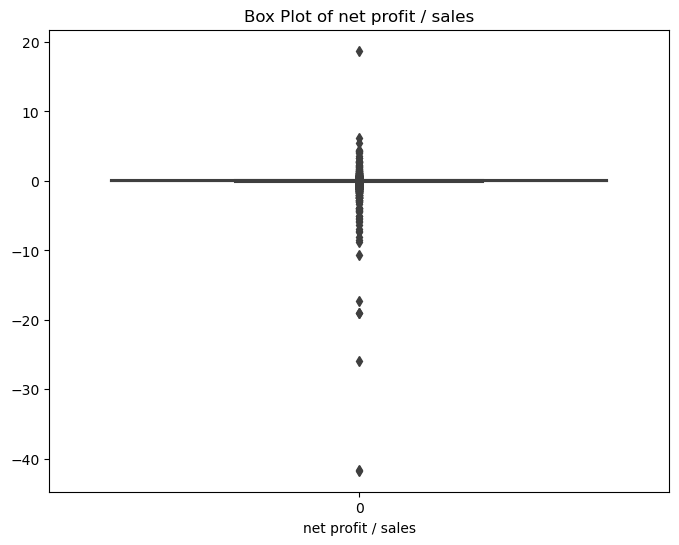

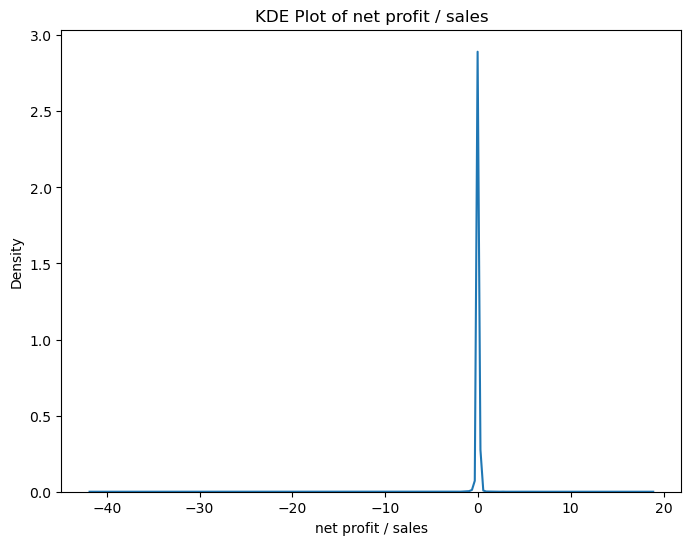

Summary statistics for net profit / sales:
count    40768.000000
mean         0.024508
std          0.427144
min        -41.711000
25%          0.002824
50%          0.029553
75%          0.075378
max         18.737000
Name: net profit / sales, dtype: float64



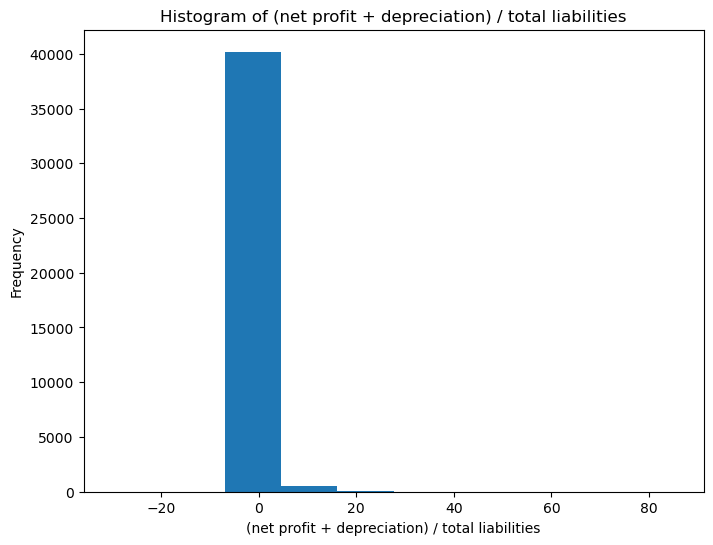

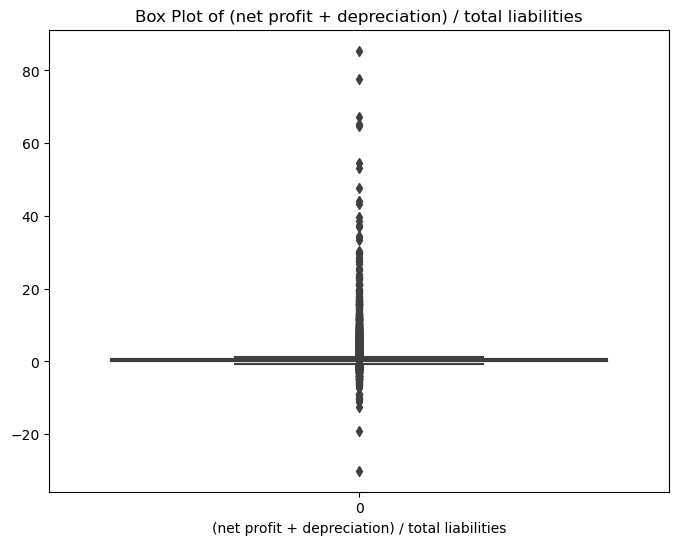

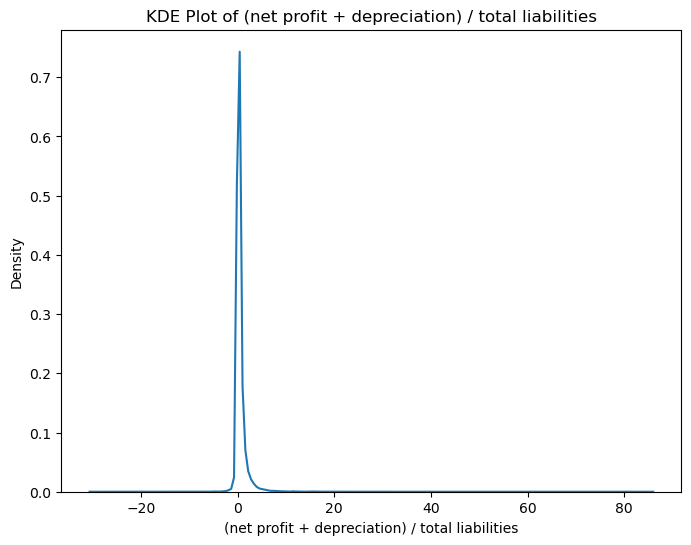

Summary statistics for (net profit + depreciation) / total liabilities:
count    40768.000000
mean         0.542600
std          1.689869
min        -30.055000
25%          0.070445
50%          0.219435
75%          0.565410
max         85.420000
Name: (net profit + depreciation) / total liabilities, dtype: float64



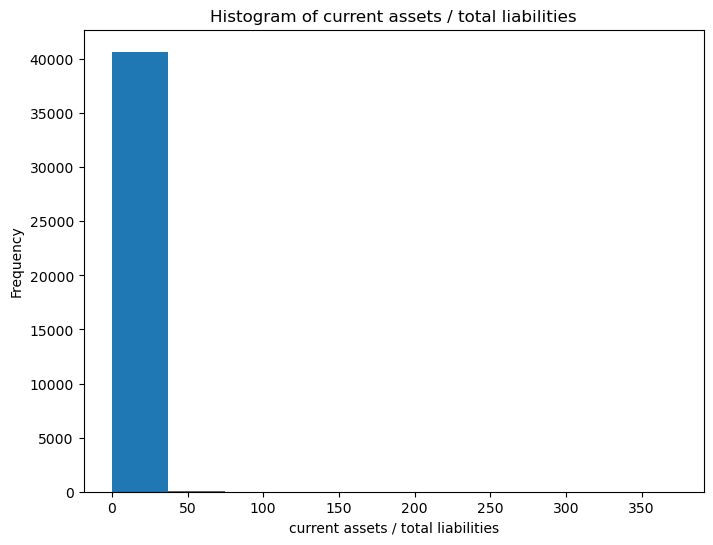

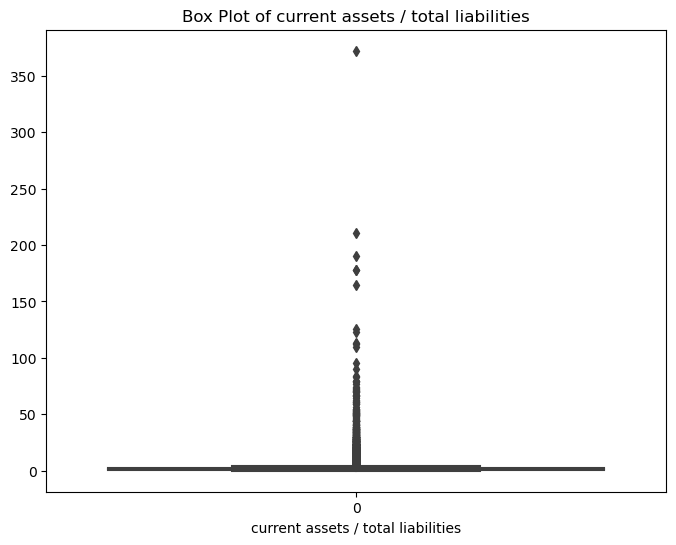

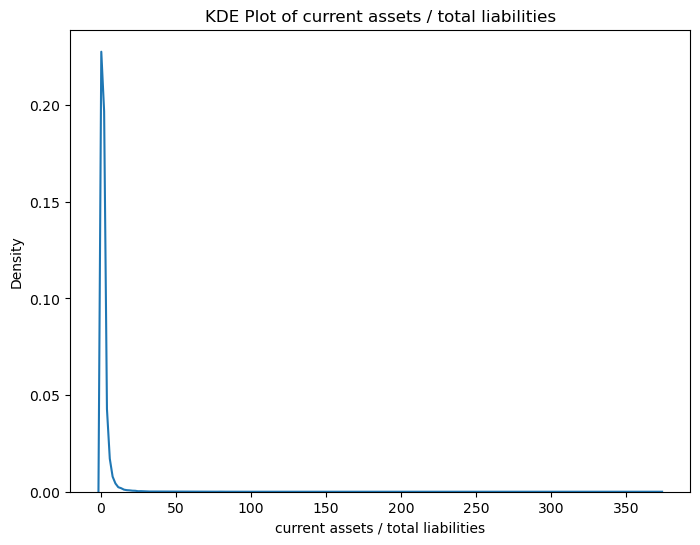

Summary statistics for current assets / total liabilities:
count    40768.000000
mean         2.140748
std          4.686848
min          0.000425
25%          0.783210
50%          1.213050
75%          2.127650
max        372.280000
Name: current assets / total liabilities, dtype: float64



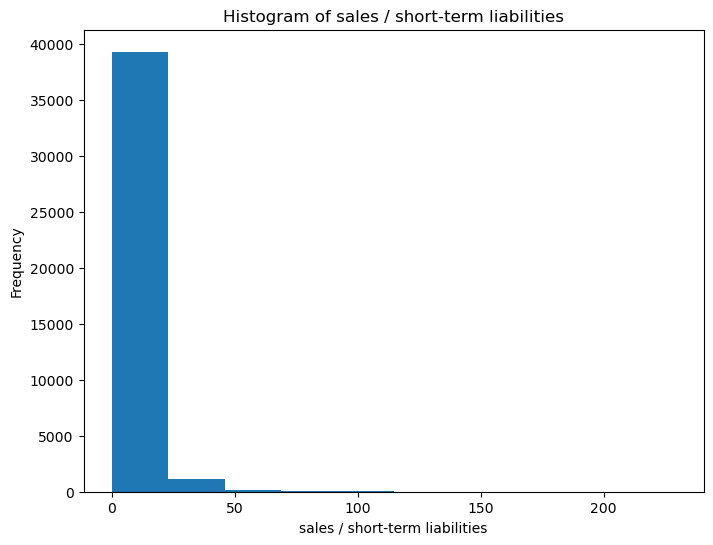

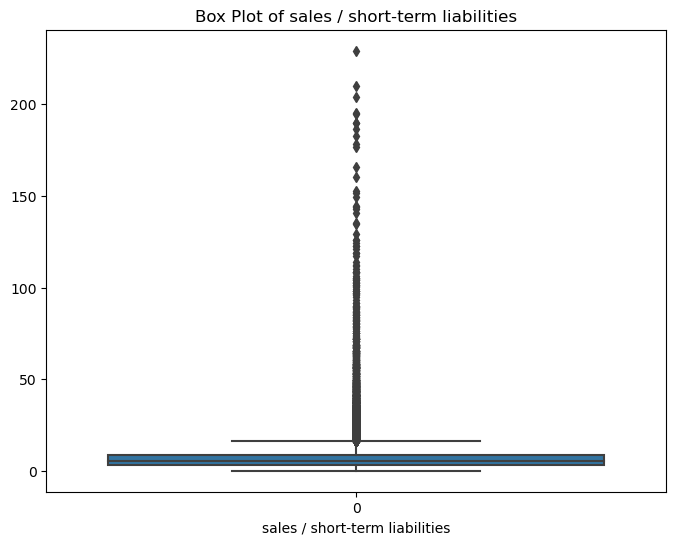

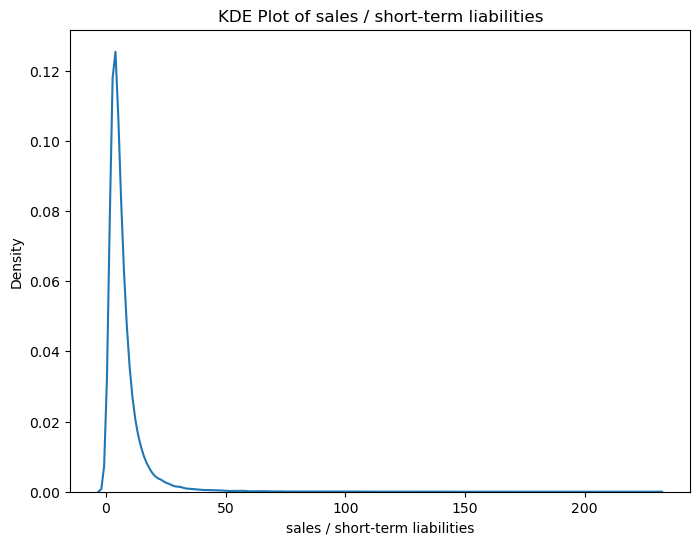

Summary statistics for sales / short-term liabilities:
count    40768.000000
mean         7.264564
std          8.813897
min          0.000000
25%          3.143850
50%          5.068100
75%          8.387050
max        229.230000
Name: sales / short-term liabilities, dtype: float64



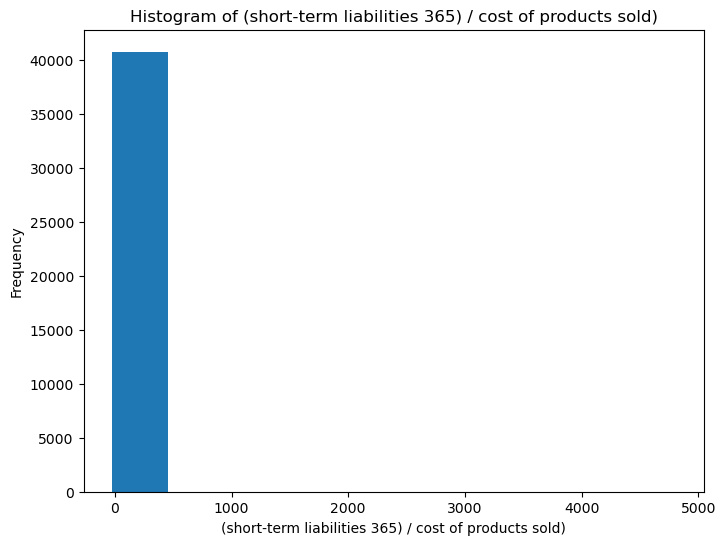

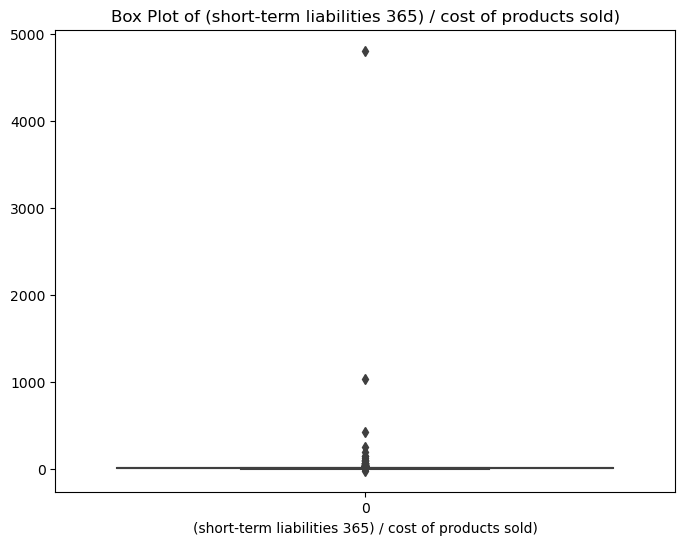

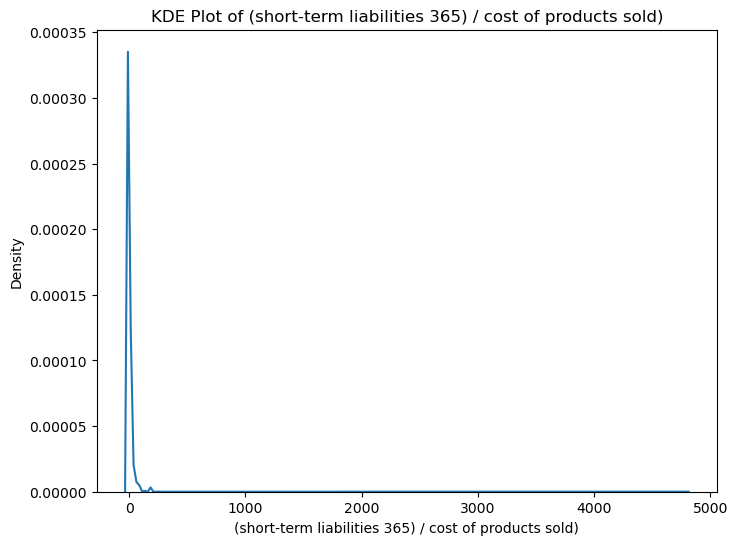

Summary statistics for (short-term liabilities 365) / cost of products sold):
count    40768.000000
mean         0.534492
std         24.548431
min        -25.467000
25%          0.130708
50%          0.215250
75%          0.345110
max       4804.400000
Name: (short-term liabilities 365) / cost of products sold), dtype: float64



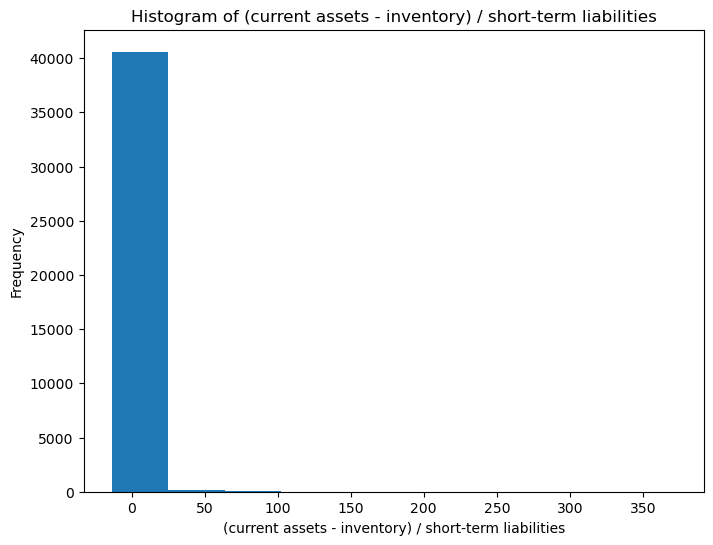

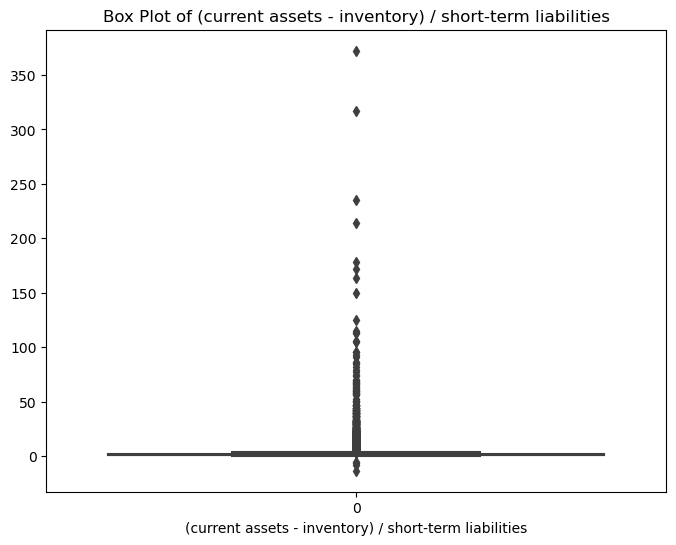

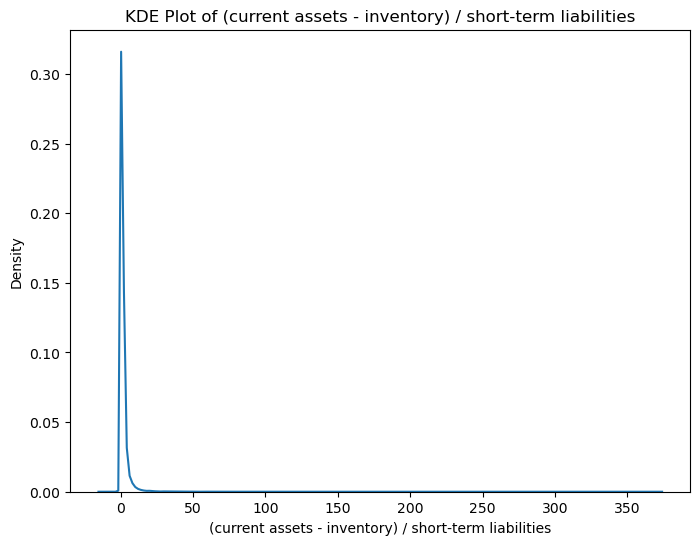

Summary statistics for (current assets - inventory) / short-term liabilities:
count    40768.000000
mean         1.908817
std          5.031481
min        -13.554000
25%          0.610520
50%          1.017800
75%          1.833800
max        372.280000
Name: (current assets - inventory) / short-term liabilities, dtype: float64



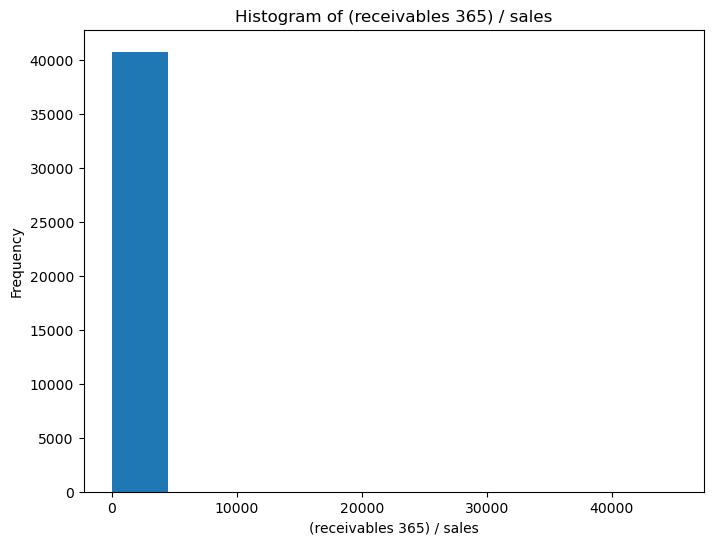

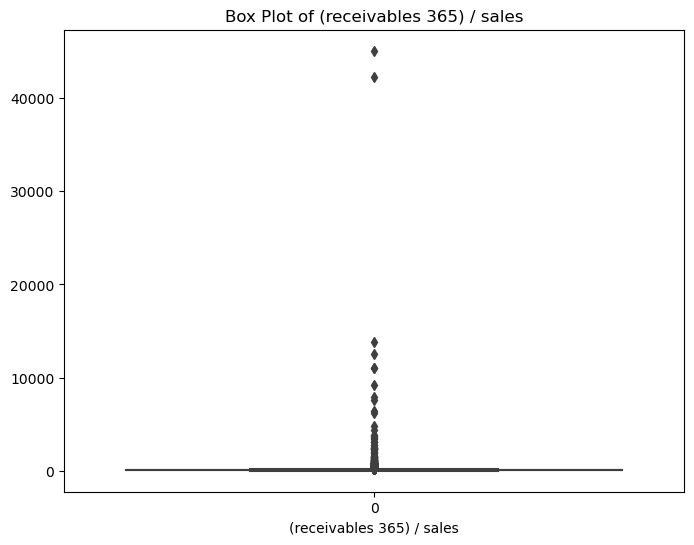

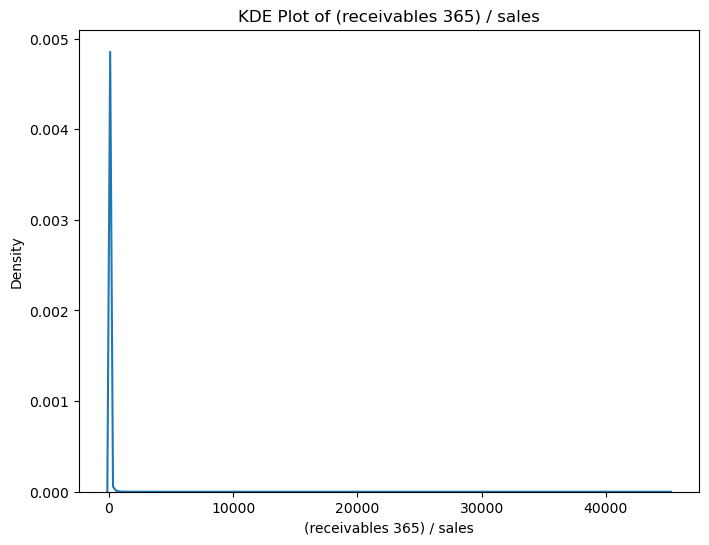

Summary statistics for (receivables 365) / sales:
count    40768.000000
mean        72.270646
std        351.518397
min          0.000000
25%         35.296500
50%         54.746000
75%         79.752250
max      45104.000000
Name: (receivables 365) / sales, dtype: float64



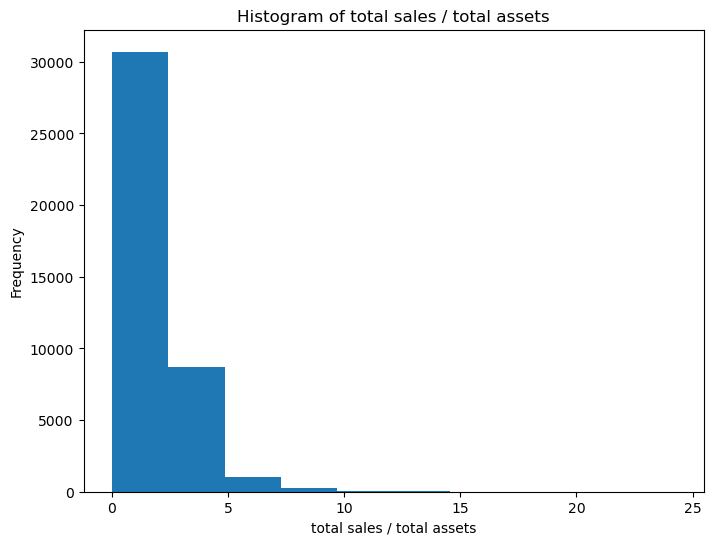

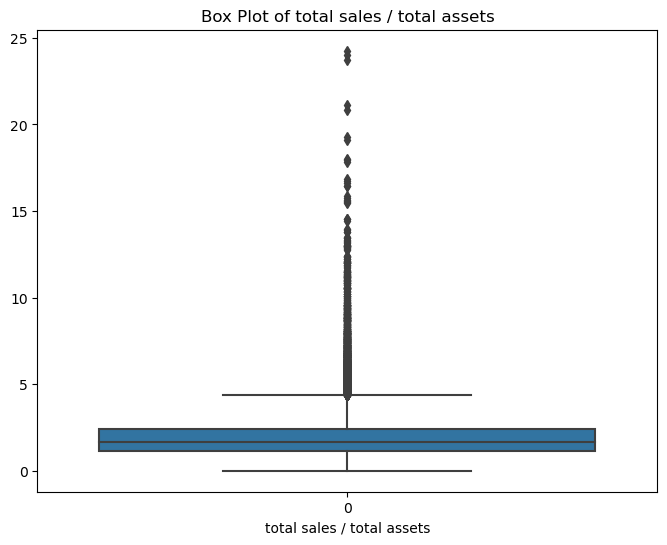

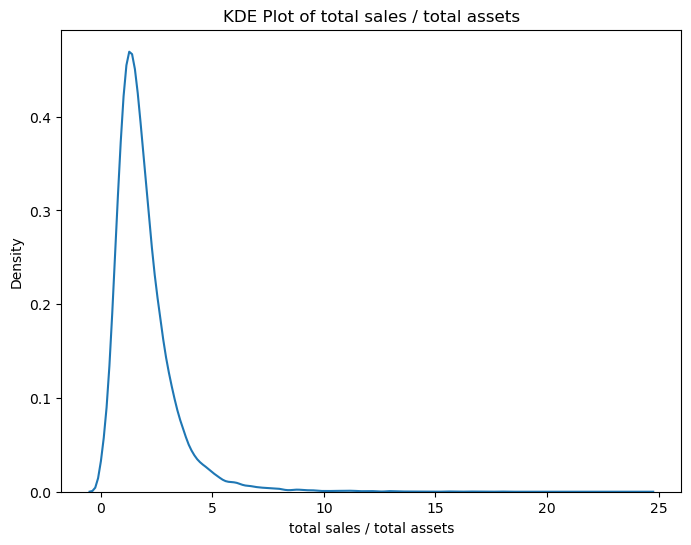

Summary statistics for total sales / total assets:
count    40768.000000
mean         1.957502
std          1.373887
min          0.000000
25%          1.123375
50%          1.654450
75%          2.413125
max         24.261000
Name: total sales / total assets, dtype: float64



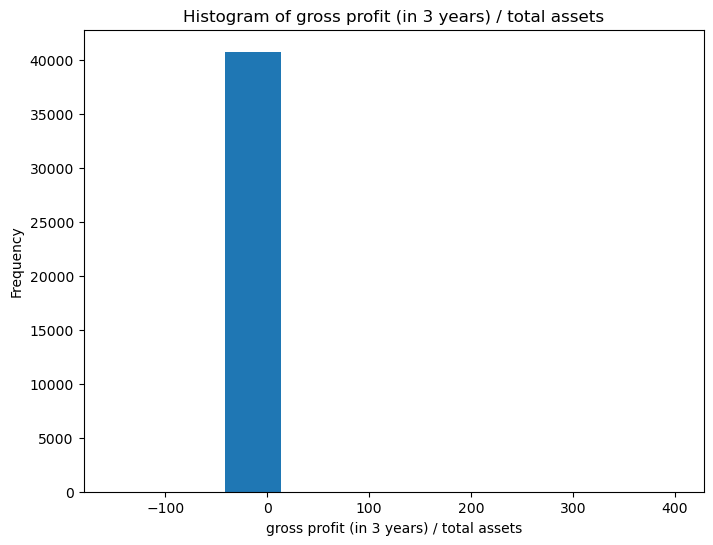

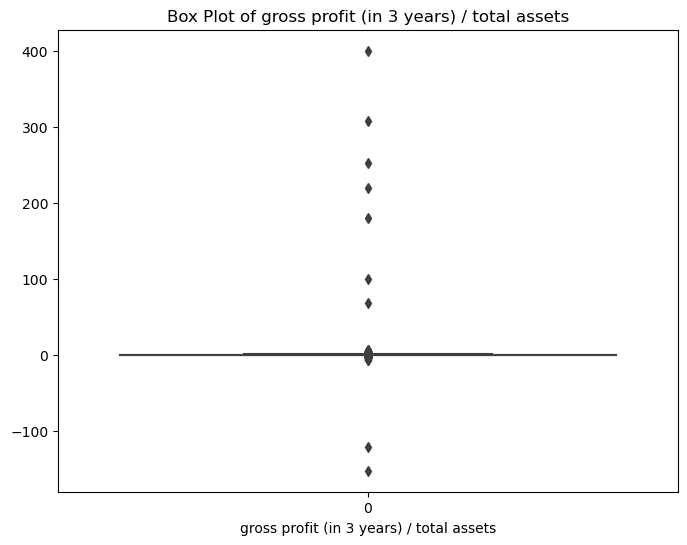

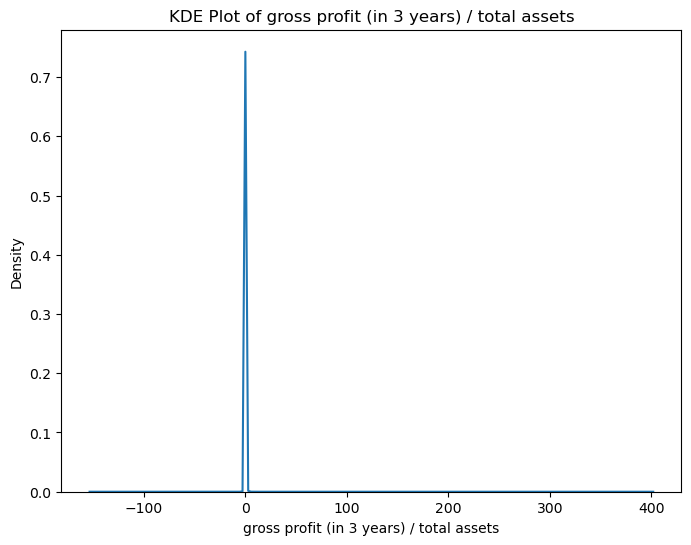

Summary statistics for gross profit (in 3 years) / total assets:
count    40768.000000
mean         0.227341
std          3.350620
min       -152.300000
25%          0.027969
50%          0.155830
75%          0.344193
max        400.590000
Name: gross profit (in 3 years) / total assets, dtype: float64



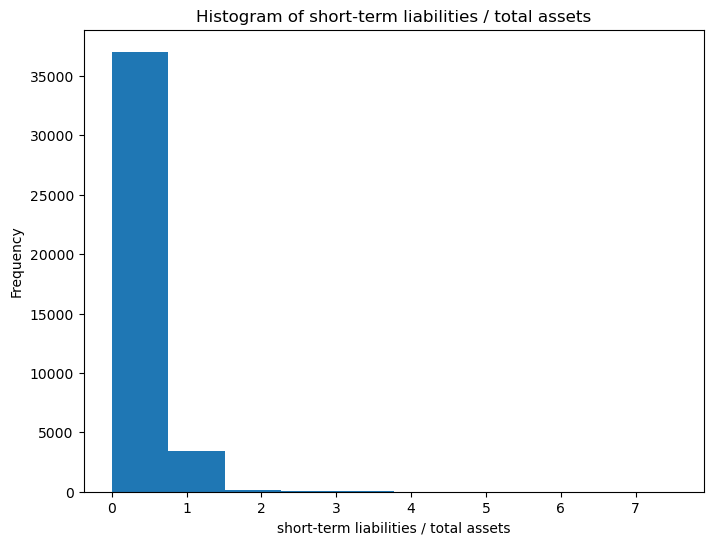

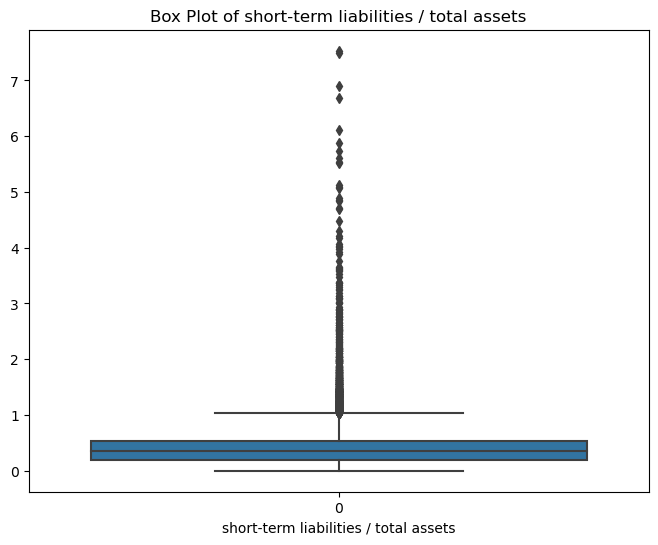

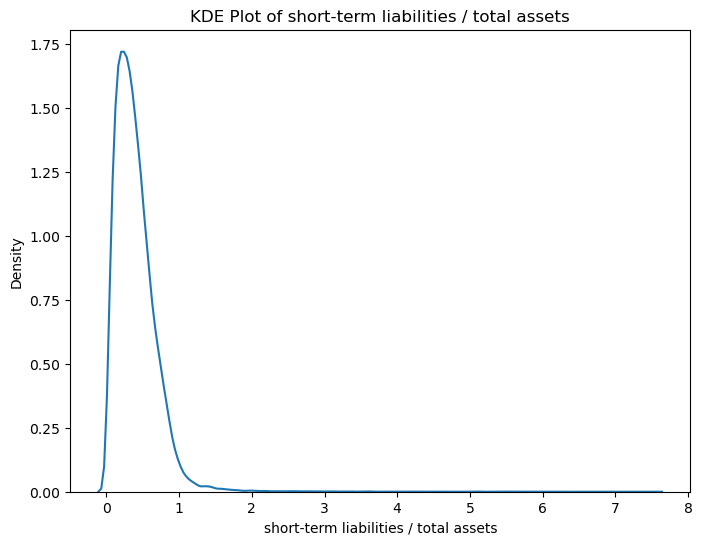

Summary statistics for short-term liabilities / total assets:
count    40768.000000
mean         0.399451
std          0.307889
min          0.000000
25%          0.198238
50%          0.345630
75%          0.533648
max          7.533700
Name: short-term liabilities / total assets, dtype: float64



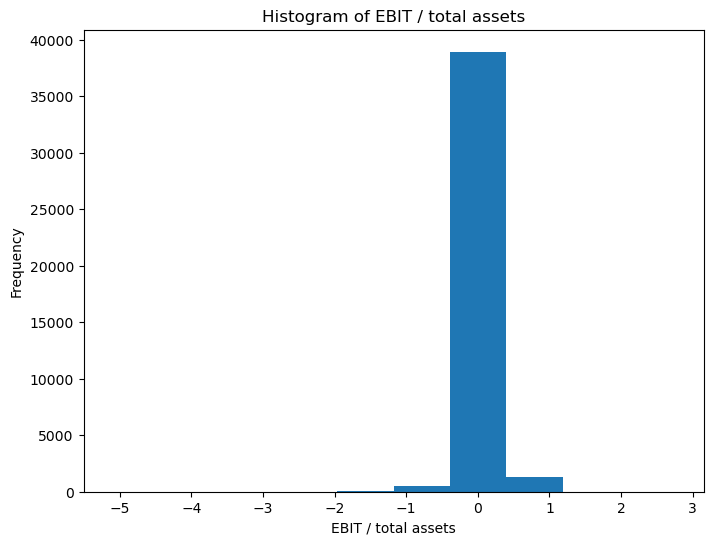

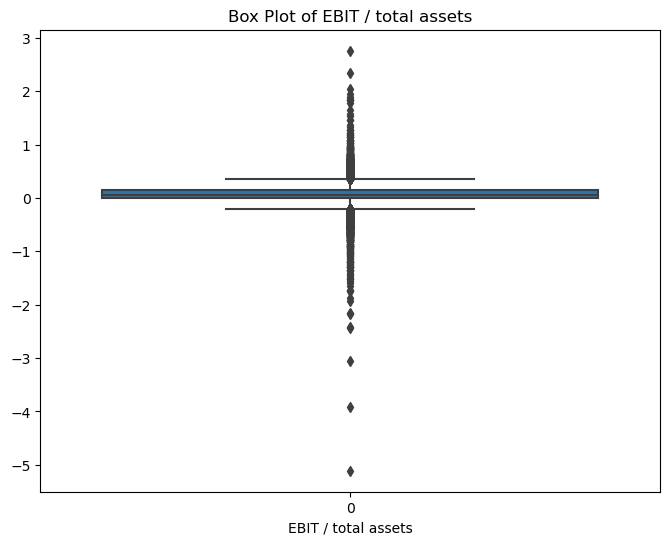

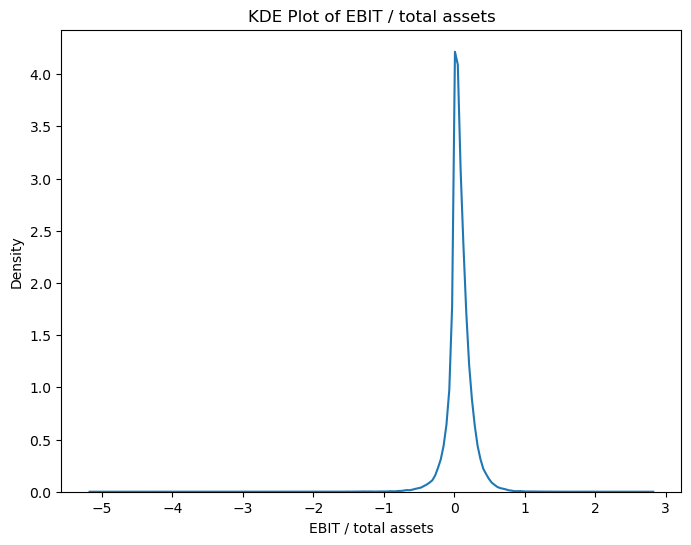

Summary statistics for EBIT / total assets:
count    40768.000000
mean         0.074217
std          0.178482
min         -5.112000
25%          0.006902
50%          0.059709
75%          0.147473
max          2.761400
Name: EBIT / total assets, dtype: float64



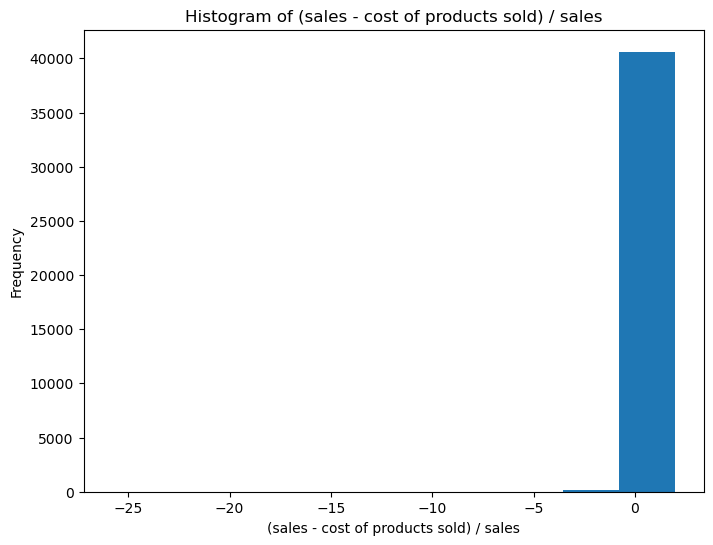

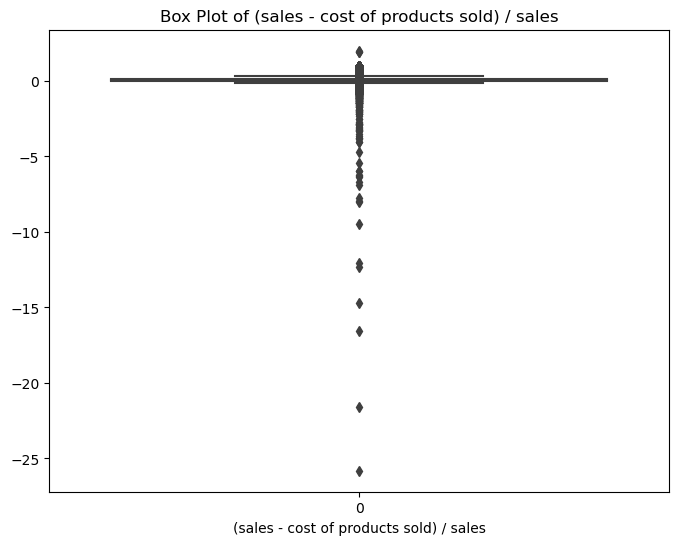

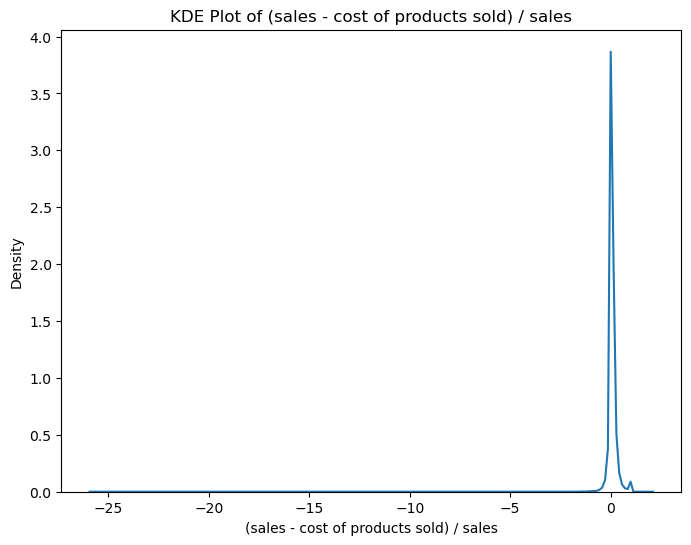

Summary statistics for (sales - cost of products sold) / sales:
count    40768.000000
mean         0.072049
std          0.321938
min        -25.814000
25%          0.010446
50%          0.052694
75%          0.124770
max          2.002300
Name: (sales - cost of products sold) / sales, dtype: float64



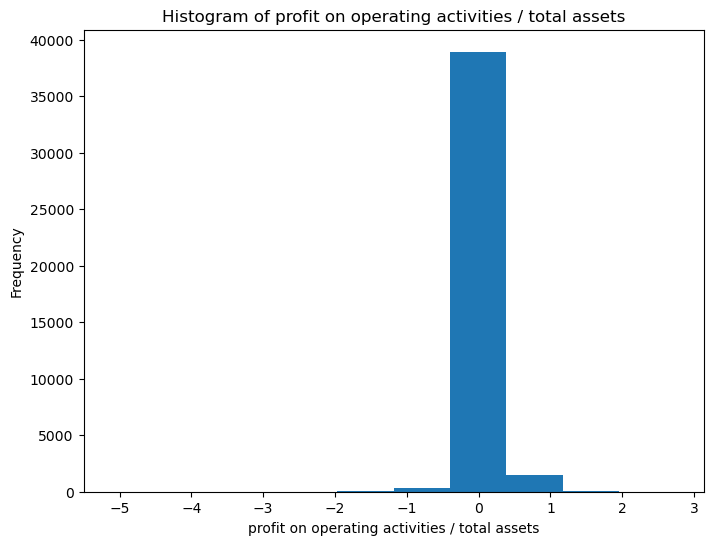

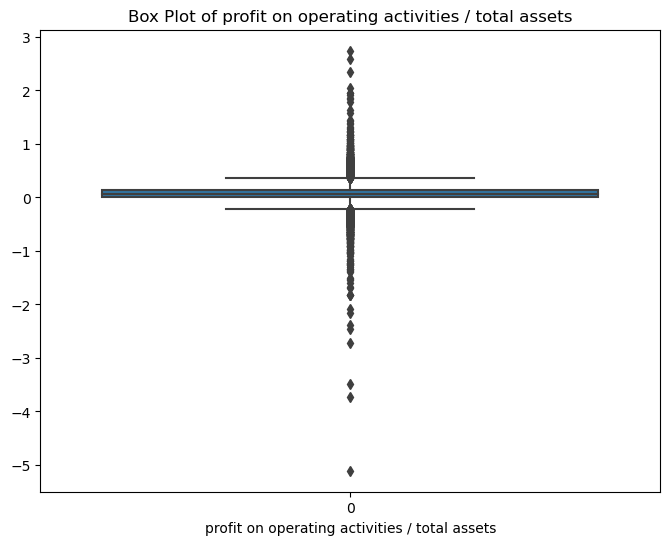

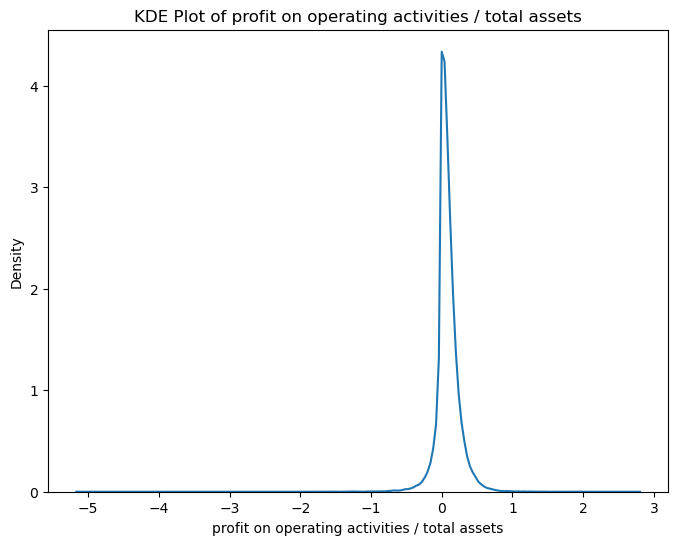

Summary statistics for profit on operating activities / total assets:
count    40768.000000
mean         0.082421
std          0.169447
min         -5.106800
25%          0.000000
50%          0.063182
75%          0.147560
max          2.741900
Name: profit on operating activities / total assets, dtype: float64



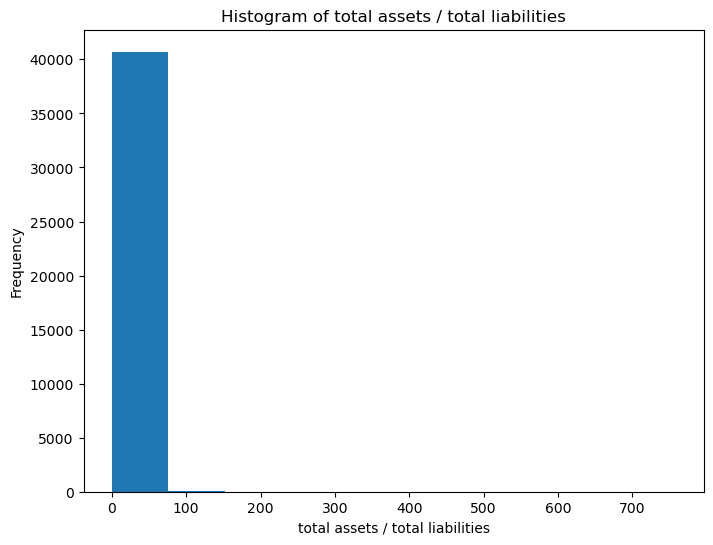

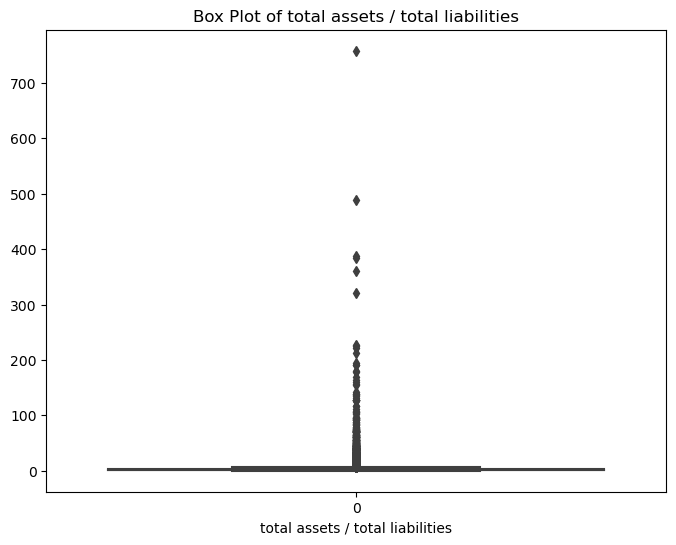

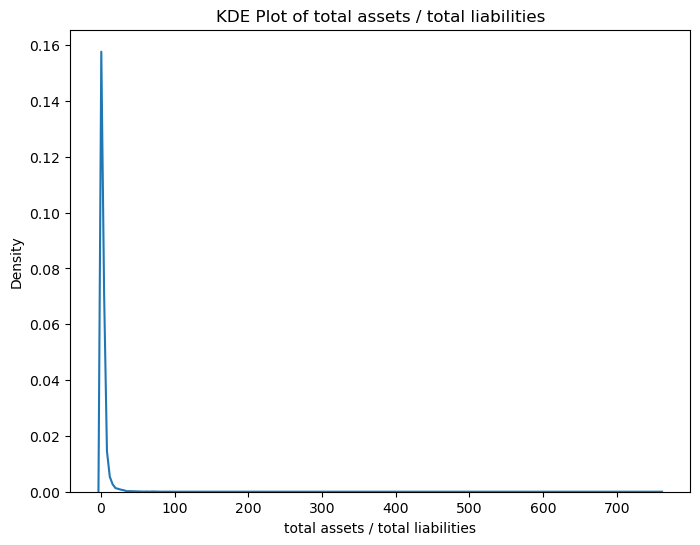

Summary statistics for total assets / total liabilities:
count    40768.000000
mean         3.723061
std          8.823709
min          0.000000
25%          1.459300
50%          2.098550
75%          3.554275
max        758.070000
Name: total assets / total liabilities, dtype: float64



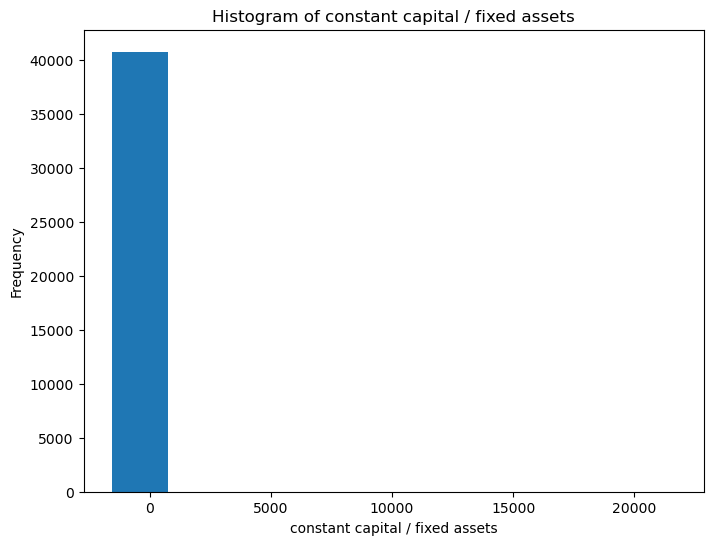

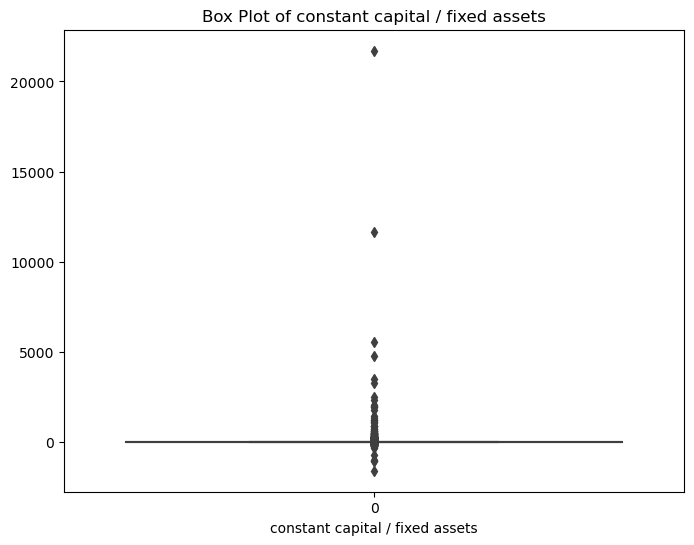

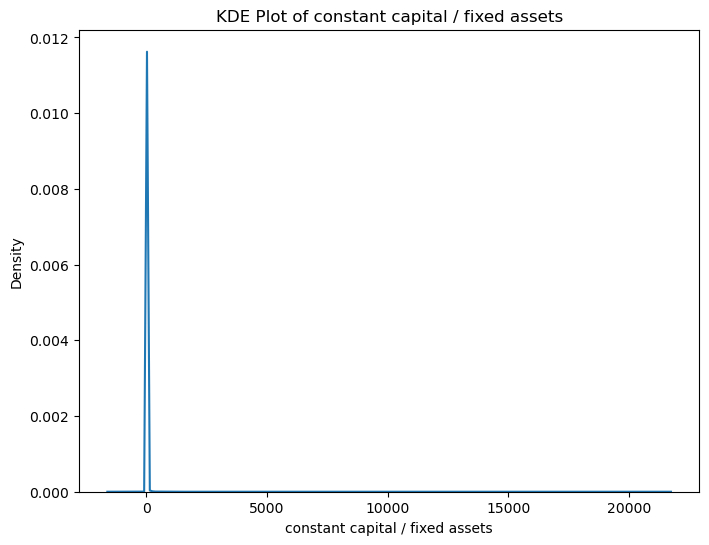

Summary statistics for constant capital / fixed assets:
count    40768.000000
mean         5.440139
std        135.574003
min      -1573.700000
25%          0.964592
50%          1.375100
75%          2.304050
max      21702.000000
Name: constant capital / fixed assets, dtype: float64



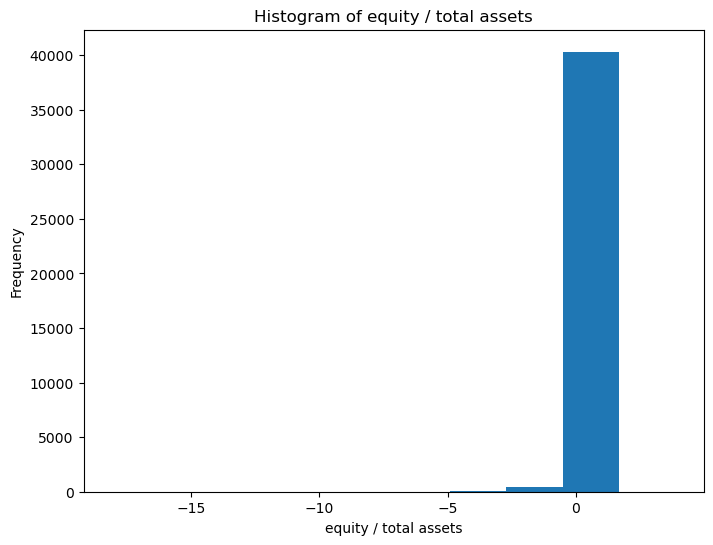

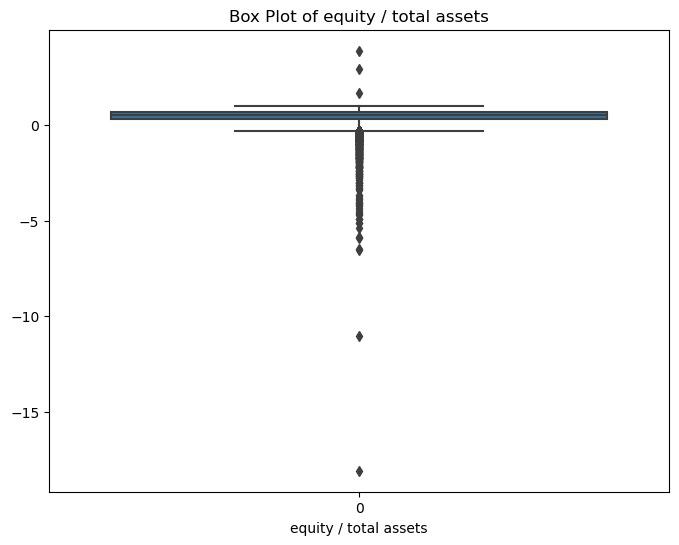

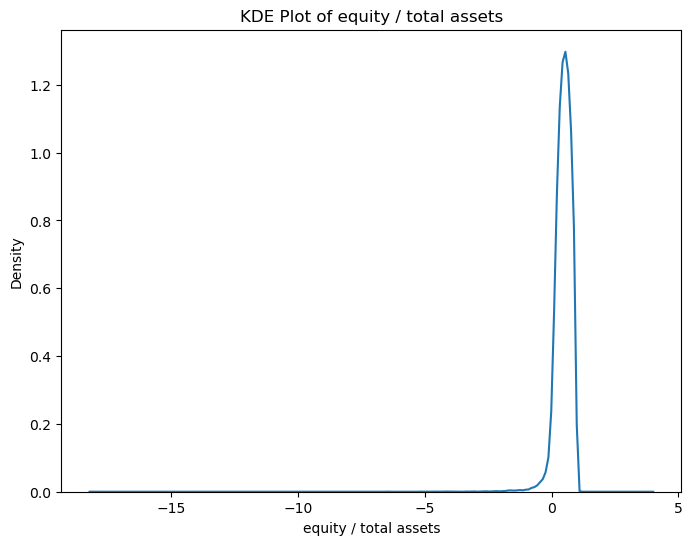

Summary statistics for equity / total assets:
count    40768.000000
mean         0.469417
std          0.366268
min        -18.085000
25%          0.297967
50%          0.501330
75%          0.696540
max          3.879100
Name: equity / total assets, dtype: float64



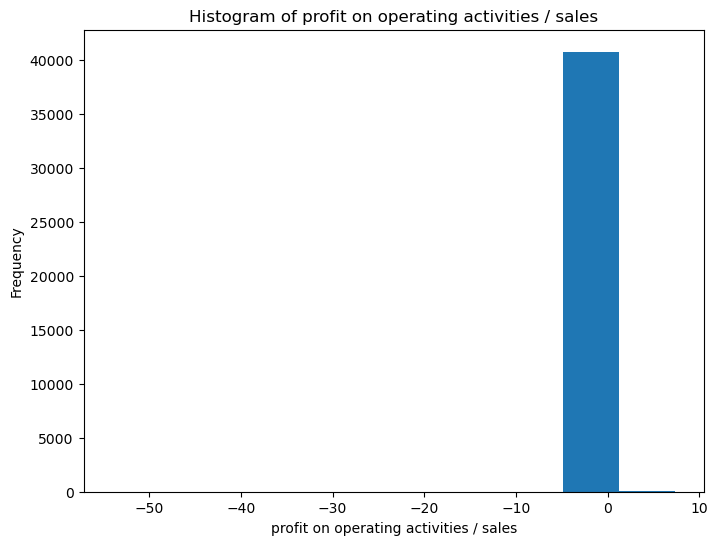

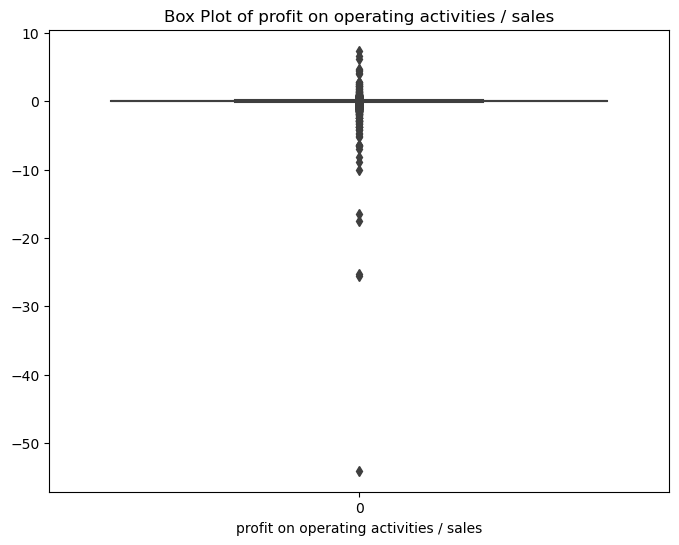

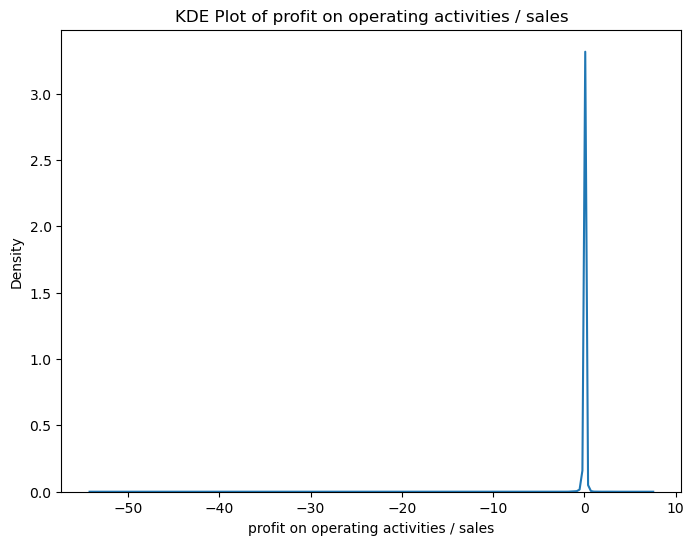

Summary statistics for profit on operating activities / sales:
count    40768.000000
mean         0.039485
std          0.400287
min        -54.089000
25%          0.000012
50%          0.038158
75%          0.090043
max          7.409100
Name: profit on operating activities / sales, dtype: float64



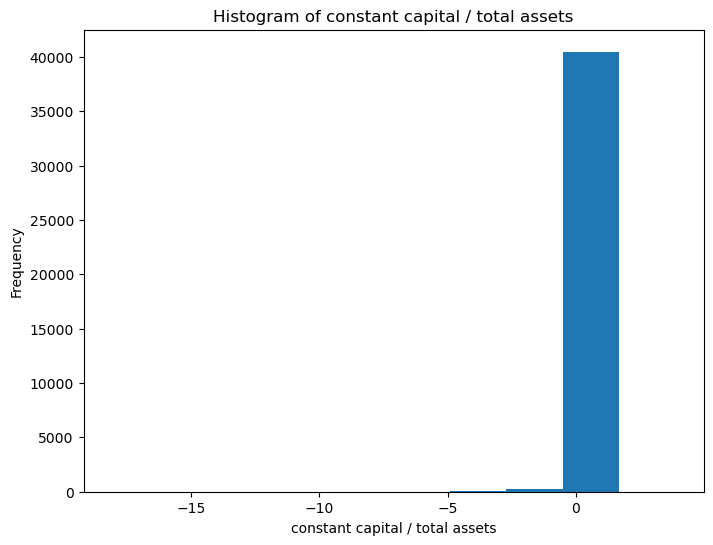

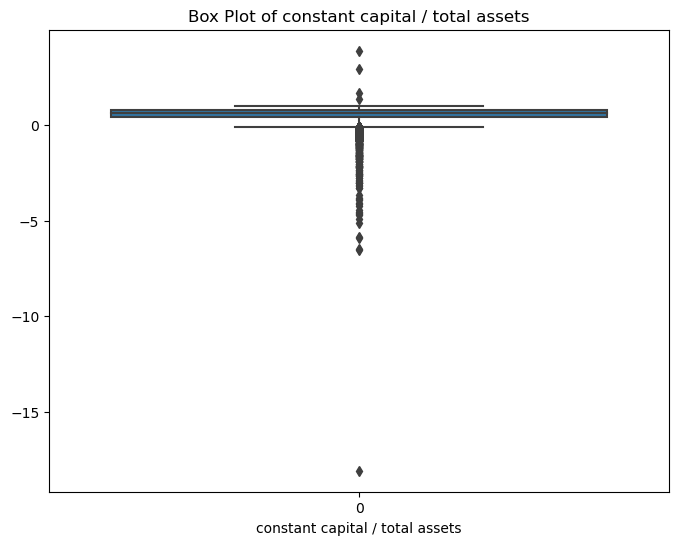

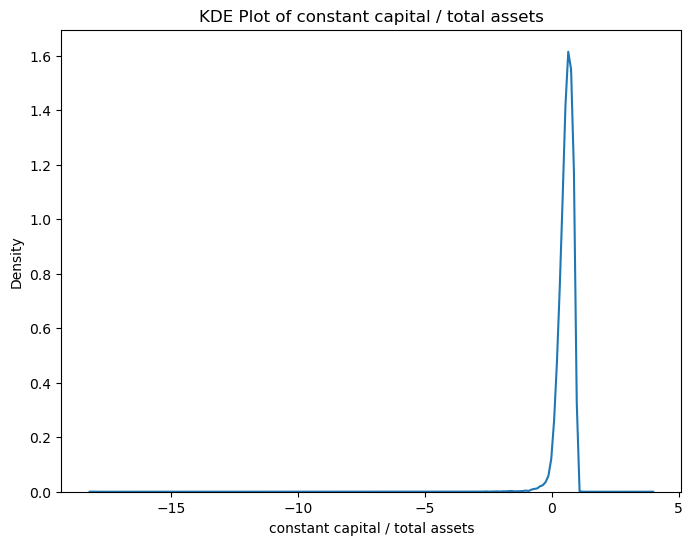

Summary statistics for constant capital / total assets:
count    40768.000000
mean         0.560734
std          0.326841
min        -18.085000
25%          0.421130
50%          0.607585
75%          0.762198
max          3.879100
Name: constant capital / total assets, dtype: float64



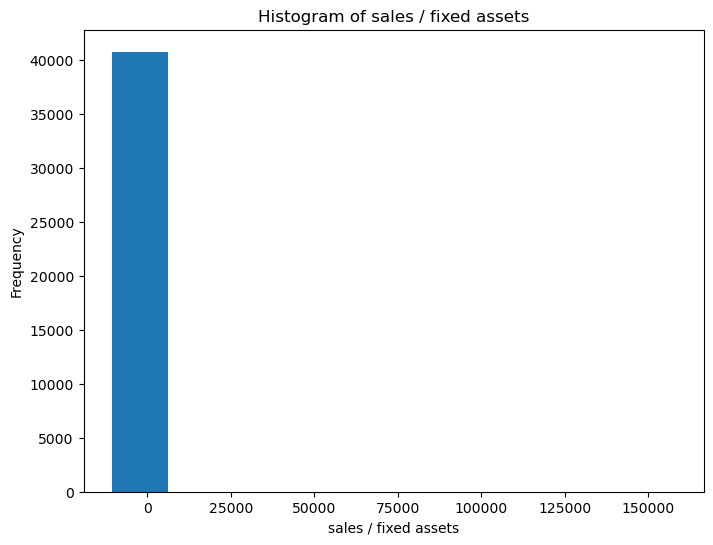

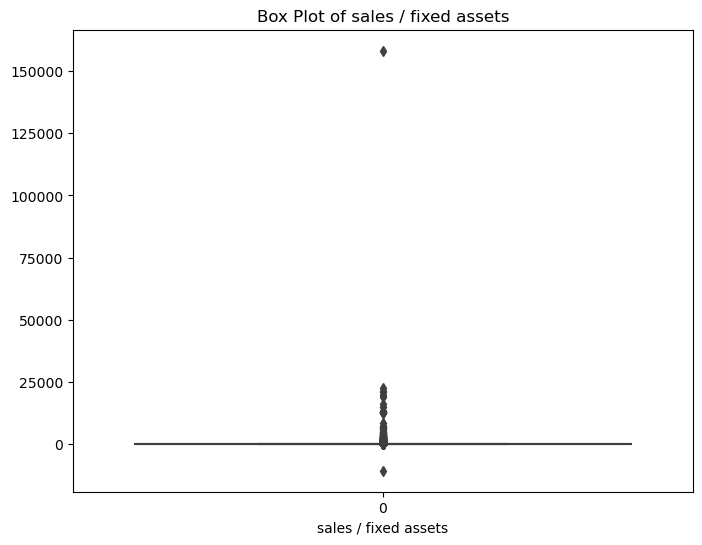

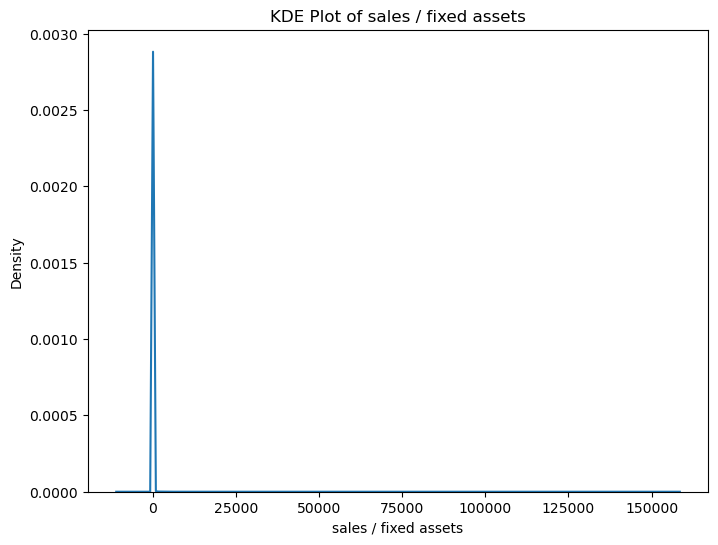

Summary statistics for sales / fixed assets:
count     40768.000000
mean         31.437160
std         858.769556
min      -10677.000000
25%           2.240275
50%           4.266250
75%           9.462225
max      158180.000000
Name: sales / fixed assets, dtype: float64



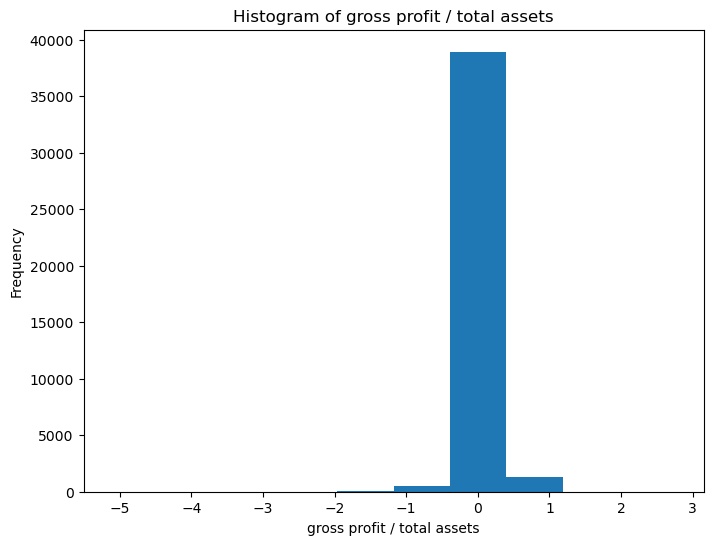

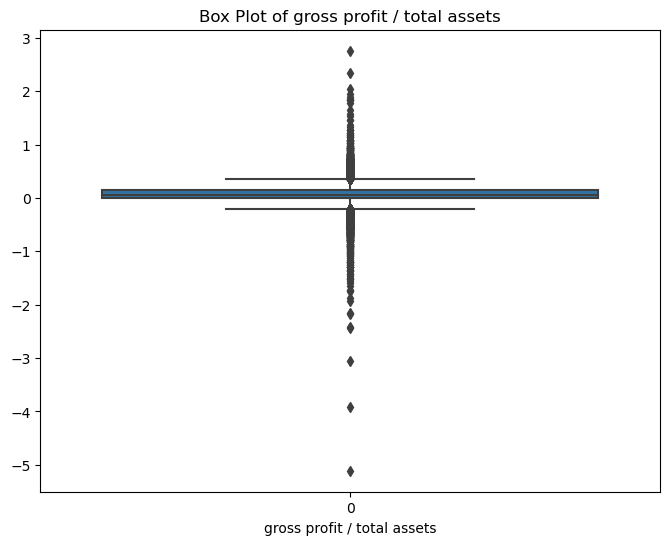

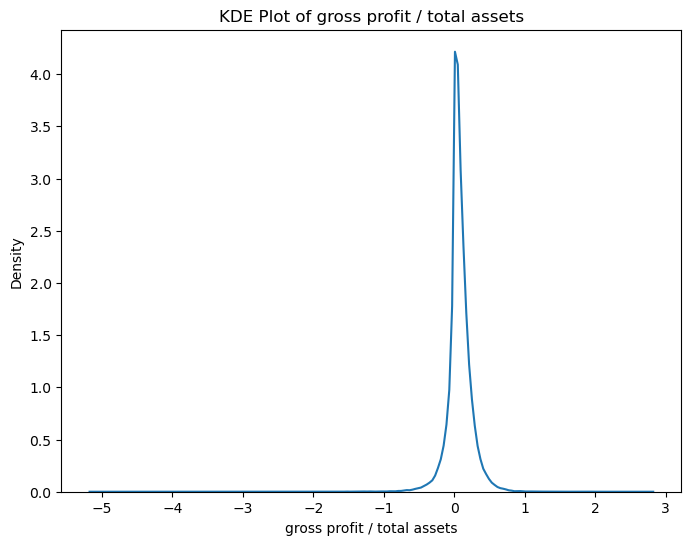

Summary statistics for gross profit / total assets:
count    40768.000000
mean         0.074217
std          0.178482
min         -5.112000
25%          0.006902
50%          0.059709
75%          0.147473
max          2.761400
Name: gross profit / total assets, dtype: float64



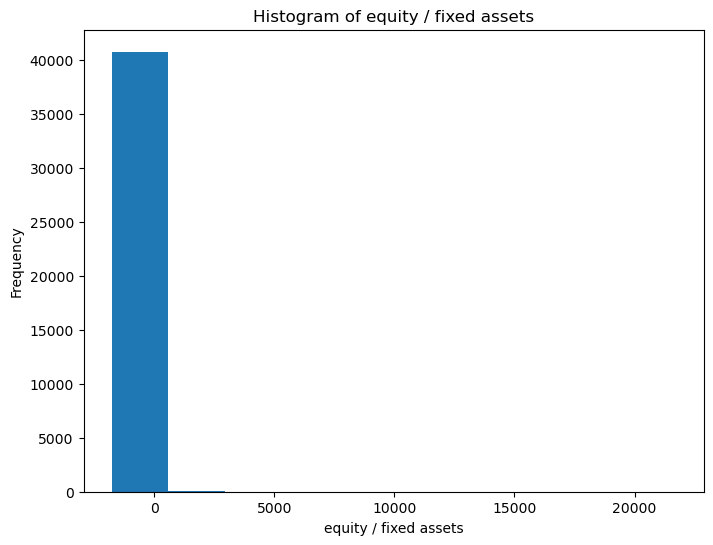

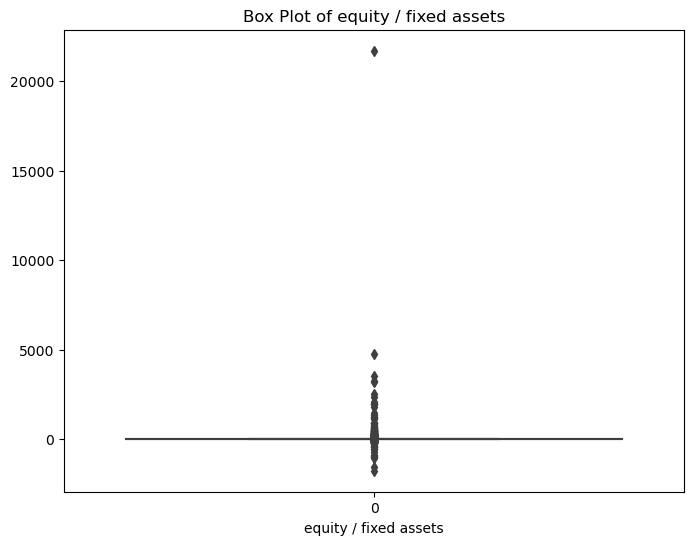

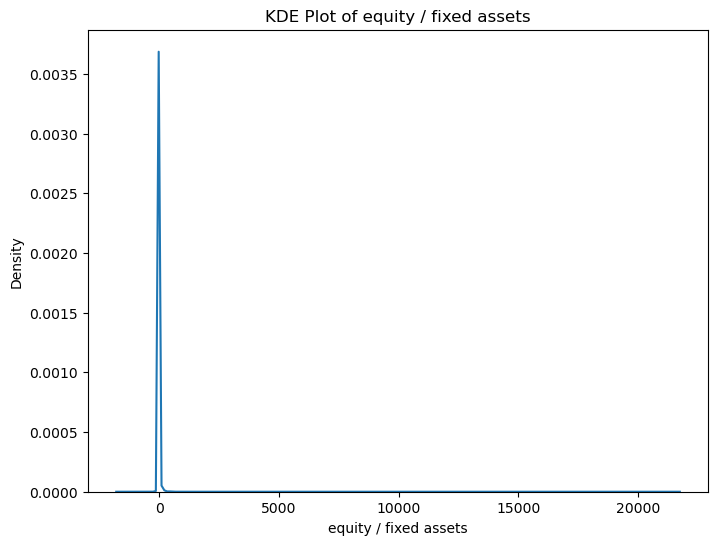

Summary statistics for equity / fixed assets:
count    40768.000000
mean         4.633645
std        120.895295
min      -1758.900000
25%          0.699483
50%          1.202200
75%          2.150450
max      21702.000000
Name: equity / fixed assets, dtype: float64



In [20]:
for column_name in filtered_data.columns:
    if filtered_data[column_name].dtype in ['int64', 'float64']:
        # Univariate analysis for numerical columns
        plt.figure(figsize=(8, 6))
        plt.hist(filtered_data[column_name], bins=10)
        plt.xlabel(column_name)
        plt.ylabel('Frequency')
        plt.title(f'Histogram of {column_name}')
        plt.show()

        plt.figure(figsize=(8, 6))
        sns.boxplot(filtered_data[column_name])
        plt.xlabel(column_name)
        plt.title(f'Box Plot of {column_name}')
        plt.show()

        plt.figure(figsize=(8, 6))
        sns.kdeplot(filtered_data[column_name])
        plt.xlabel(column_name)
        plt.ylabel('Density')
        plt.title(f'KDE Plot of {column_name}')
        plt.show()
    # Display summary statistics for all columns
    summary_stats = merged_df[column_name].describe()
    print(f'Summary statistics for {column_name}:\n{summary_stats}\n')

**Bi-Variate**

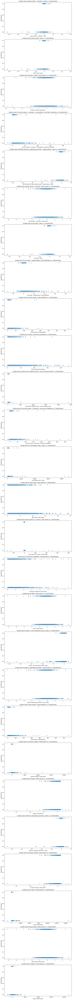

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with the columns for analysis, including the target variable 'Classification'
# Replace 'df' with the actual DataFrame you want to analyze

# Define the name of the target variable
target_variable_name = 'Classification'

# Calculate the number of rows and columns for the subplots grid
num_rows = len(filtered_data.columns)   # Excluding the target variable
num_cols = 1

# Create subplots with the specified grid layout
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5*num_rows))

# Loop through each column (excluding the target variable) and plot its scatter plot against the target
for i, col in enumerate(filtered_data.columns):
    if col == target_variable_name:  # Skip the target variable itself
        continue

    ax = axes[i] if num_rows > 1 else axes  # Handle the case of a single row of subplots
    ax.scatter(filtered_data[col], merged_df[target_variable_name], alpha=0.5)
    ax.set_xlabel(col)
    ax.set_ylabel(target_variable_name)
    ax.set_title(f"Scatter plot of {col} vs. {target_variable_name}")

# Adjust the layout and spacing of subplots
plt.tight_layout()

# Show the subplots
plt.show()


Pair Plot

In [22]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Assuming you have a DataFrame called 'df' with the columns for analysis
# # Replace 'df' with the actual DataFrame you want to analyze

# # Create a DataFrame containing only the numerical columns for pair plotting
# numerical_df = filtered_data.select_dtypes(include=[float, int])

# # Calculate the number of rows and columns for the subplots grid
# num_cols = len(numerical_df.columns)

# # Create subplots with the specified grid layout
# fig, axes = plt.subplots(num_cols, num_cols, figsize=(10*num_cols, 10*num_cols))

# # Loop through each combination of numerical columns and plot their pair plots
# for i, col1 in enumerate(numerical_df.columns):
#     for j, col2 in enumerate(numerical_df.columns):
#         ax = axes[i, j]  # Accessing the current subplot
#         sns.scatterplot(x=col1, y=col2, data=filtered_data, ax=ax)  # Plot scatter plot between col1 and col2
#         ax.set_xlabel(col1)
#         ax.set_ylabel(col2)

# # Adjust the layout and spacing of subplots
# plt.tight_layout()

# # Show the subplots
# plt.show()


the above code doesn't work as it is too much to make all combinations from 27 column, so instead i generated 4 random columns and see combinations of all of them

In [23]:
len(filtered_data.columns)

27

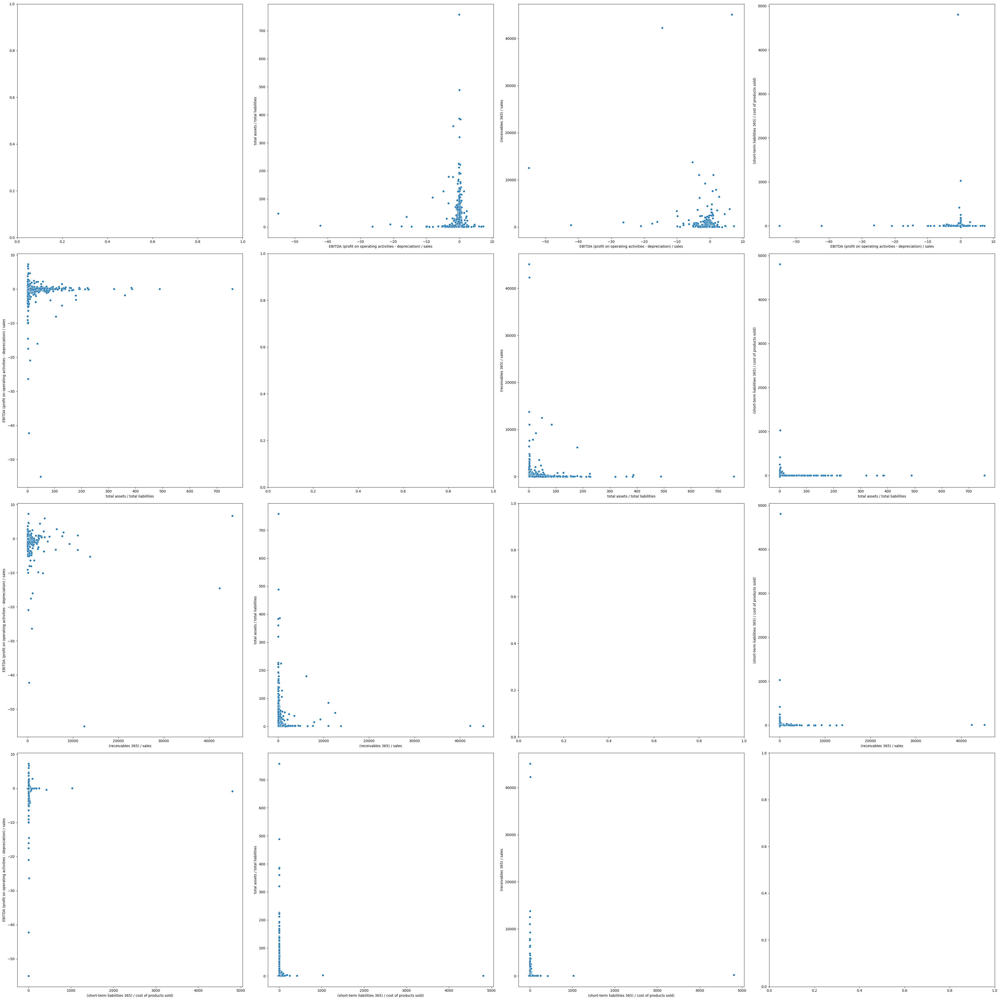

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random

# Assuming you have a DataFrame called 'filtered_data' with the columns for analysis
# Replace 'filtered_data' with the actual DataFrame you want to analyze

# Create a DataFrame containing only the numerical columns for pair plotting
numerical_df = filtered_data.select_dtypes(include=[float, int])

# Define the number of random columns to select for pair plotting (change as needed)
num_random_columns = 4

# Randomly select 'num_random_columns' columns for pair plotting
random_columns = random.sample(list(numerical_df.columns), num_random_columns)

# Calculate the number of rows and columns for the subplots grid
num_cols = len(random_columns)

# Create subplots with the specified grid layout
fig, axes = plt.subplots(num_cols, num_cols, figsize=(10*num_cols, 10*num_cols))

# Loop through each combination of randomly selected columns and plot their pair plots
for i, col1 in enumerate(random_columns):
    for j, col2 in enumerate(random_columns):
        if col1 != col2:  # Skip if col1 is equal to col2
            ax = axes[i, j]  # Accessing the current subplot
            sns.scatterplot(x=col1, y=col2, data=filtered_data, ax=ax)  # Plot scatter plot between col1 and col2
            ax.set_xlabel(col1)
            ax.set_ylabel(col2)

# Adjust the layout and spacing of subplots
plt.tight_layout()

# Show the subplots
plt.show()


30% of the columns

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random

# Assuming you have a DataFrame called 'filtered_data' with the columns for analysis
# Replace 'filtered_data' with the actual DataFrame you want to analyze

# Create a DataFrame containing only the numerical columns for pair plotting
numerical_df = filtered_data.select_dtypes(include=[float, int])

# Define the number of random columns to select for pair plotting (change as needed)
num_random_columns = int(len(numerical_df.columns) * 0.3)  # Calculate 30% of the total columns

# Randomly select 30% of the columns for pair plotting
random_columns = random.sample(list(numerical_df.columns), num_random_columns)

# Calculate the number of rows and columns for the subplots grid
num_cols = len(random_columns)

# Create subplots with the specified grid layout
fig, axes = plt.subplots(num_cols, num_cols, figsize=(10*num_cols, 10*num_cols))

# Loop through each combination of randomly selected columns and plot their pair plots
for i, col1 in enumerate(random_columns):
    for j, col2 in enumerate(random_columns):
        if col1 != col2:  # Skip if col1 is equal to col2
            ax = axes[i, j]  # Accessing the current subplot
            sns.scatterplot(x=col1, y=col2, data=filtered_data, ax=ax)  # Plot scatter plot between col1 and col2
            ax.set_xlabel(col1)
            ax.set_ylabel(col2)

# Adjust the layout and spacing of subplots
plt.tight_layout()

# Show the subplots
plt.show()


Multi-variate analysis

Scattered plot Matrix

Bar charts

In [26]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Assuming you have a DataFrame called 'filtered_data' with the columns for analysis
# # Replace 'filtered_data' with the actual DataFrame you want to analyze

# # Define the columns to include for multivariate analysis
# columns_to_include = ['profit on sales / total assets', 'total sales / total assets', 'total assets / total liabilities']

# # Calculate the number of rows and columns for the subplots grid
# num_cols = len(columns_to_include)

# # Create subplots with the specified grid layout
# fig, axes = plt.subplots(num_cols, figsize=(8, 6*num_cols))

# # Loop through each specified column and plot its bar chart
# for i, col in enumerate(columns_to_include):
#     ax = axes[i]  # Accessing the current subplot
#     filtered_data[col].value_counts().plot(kind='bar', ax=ax)  # Plot bar chart for the selected column
#     ax.set_xlabel(col)
#     ax.set_ylabel('Count')

# # Adjust the layout and spacing of subplots
# plt.tight_layout()

# # Show the subplots
# plt.show()


Heatmap is done at the beginning of the notebook

Grouped Bar Chart for numerical data

Random number of columns (it takes a lot of time running)

In [27]:
# import random


# #Define the number of random columns to select
# num_columns_to_select = 3  # Change this value as needed

# #Get a list of all numerical column names from the DataFrame
# numerical_columns = filtered_data.select_dtypes(include='number').columns.tolist()

# #Randomly select 'num_columns_to_select' columns from the list
# selected_columns = random.sample(numerical_columns, num_columns_to_select)

# #Create a DataFrame with only the selected columns
# selected_data = filtered_data[selected_columns]

# #Calculate the mean for each selected numerical column
# agg_data = selected_data.mean()

# #Reset the index to convert the series into a DataFrame
# agg_data = agg_data.reset_index()

# #Melt the DataFrame to long format
# melted_data = agg_data.melt(id_vars='index', var_name='Numerical Column', value_name='Mean Value')

# #Create the multivariate bar chart
# plt.figure(figsize=(10, 6))
# sns.barplot(filtered_data=melted_data, x='index', y='Mean Value', hue='Numerical Column', palette='Set3')
# plt.xlabel('Categories')
# plt.ylabel('Mean Value')
# plt.title('Multivariate Bar Chart of Random Numerical Columns')
# plt.legend(title='Numerical Columns', loc='upper right')
# plt.xticks(rotation=45)
# plt.show()

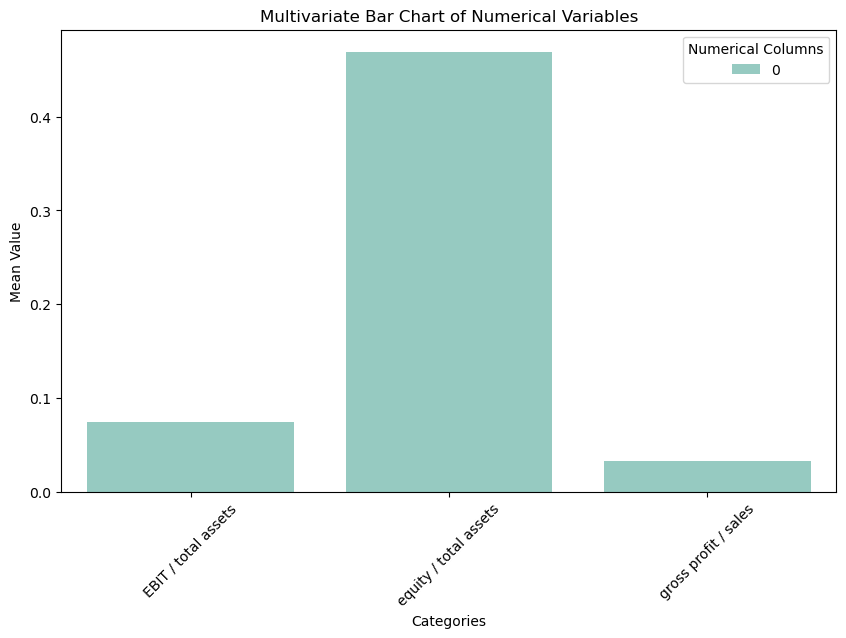

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

#Assuming 'data' is your DataFrame with multiple numerical columns
#Define the columns for the multivariate bar chart
numerical_columns = ['EBIT / total assets', 'equity / total assets', 'gross profit / sales']
#Calculate the mean or sum for each numerical column
agg_data = filtered_data[numerical_columns].mean()  # Change 'mean()' to 'sum()' if you want to calculate the sum

#Reset the index to convert the series into a DataFrame
agg_data = agg_data.reset_index()

#Melt the DataFrame to long format
melted_data = agg_data.melt(id_vars='index', var_name='Numerical Column', value_name='Mean Value')

#Create the multivariate bar chart
plt.figure(figsize=(10, 6))
sns.barplot(data=melted_data, x='index', y='Mean Value', hue='Numerical Column', palette='Set3')
plt.xlabel('Categories')
plt.ylabel('Mean Value')  # Change to 'Sum Value' if using sum aggregation
plt.title('Multivariate Bar Chart of Numerical Variables')
plt.legend(title='Numerical Columns', loc='upper right')
plt.xticks(rotation=45)
plt.show()

3D Scatter Plot

In [29]:
filtered_data.columns

Index(['(gross profit + interest) / sales', 'gross profit / sales',
       'profit on sales / total assets',
       '(current assets - inventory - receivables) / short-term liabilities',
       'EBITDA (profit on operating activities - depreciation) / sales',
       '(gross profit + interest) / total assets', 'net profit / sales',
       '(net profit + depreciation) / total liabilities',
       'current assets / total liabilities', 'sales / short-term liabilities',
       '(short-term liabilities 365) / cost of products sold)',
       '(current assets - inventory) / short-term liabilities',
       '(receivables 365) / sales', 'total sales / total assets',
       'gross profit (in 3 years) / total assets',
       'short-term liabilities / total assets', 'EBIT / total assets',
       '(sales - cost of products sold) / sales',
       'profit on operating activities / total assets',
       'total assets / total liabilities', 'constant capital / fixed assets',
       'equity / total assets'

for random columns

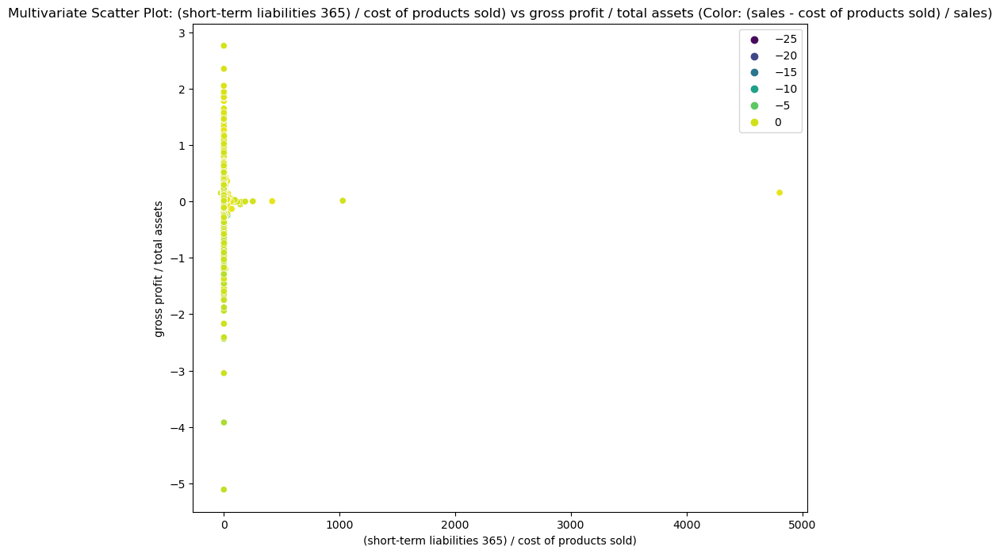

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import random

# Assuming 'filtered_data' is your DataFrame containing multiple numerical columns including 'Classification'
# Replace 'filtered_data' with the actual DataFrame you want to analyze

# Get a list of all numerical columns in the DataFrame (excluding 'Classification')
numerical_columns = filtered_data.select_dtypes(include=[float, int]).columns.tolist()

# Define the number of random columns to select for the multivariate scatter plot (change as needed)
num_random_columns = 3

# Randomly select 'num_random_columns' columns for the multivariate scatter plot
random_columns = random.sample(numerical_columns, num_random_columns)

# Create the multivariate scatter plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=filtered_data, x=random_columns[0], y=random_columns[1], hue=random_columns[2], palette='viridis')
plt.xlabel(random_columns[0])
plt.ylabel(random_columns[1])
plt.title(f'Multivariate Scatter Plot: {random_columns[0]} vs {random_columns[1]} (Color: {random_columns[2]})')
plt.legend()
plt.show()


For specified columns

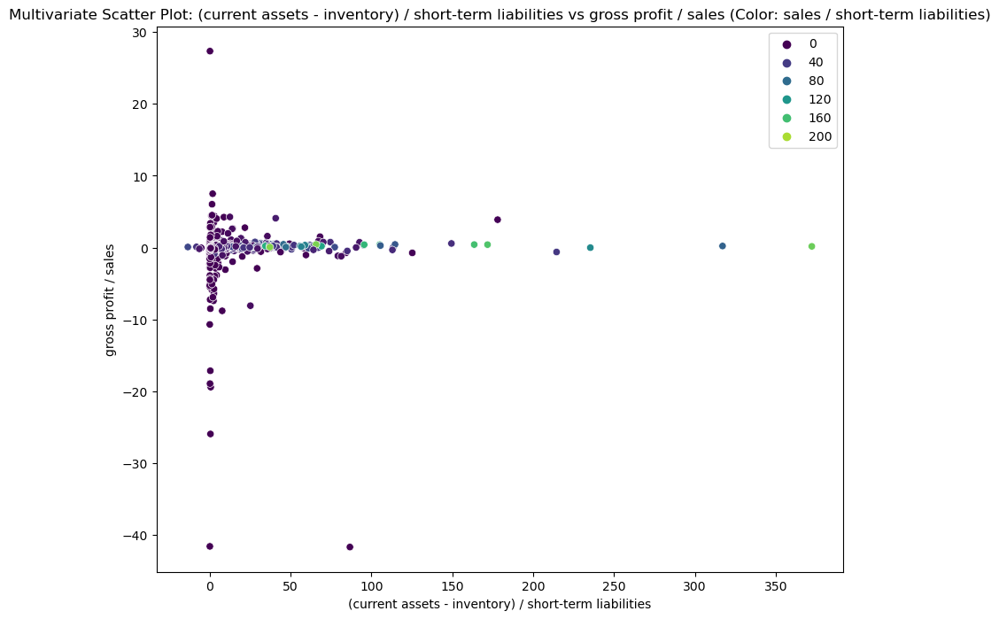

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

#Assuming 'data' is your DataFrame containing multiple numerical columns including 'Classification'
#Select the columns for the multivariate scatter plot
x_var = '(current assets - inventory) / short-term liabilities'
y_var = 'gross profit / sales'
color_var = 'sales / short-term liabilities'

#Create the multivariate scatter plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=filtered_data, x=x_var, y=y_var, hue=color_var, palette='viridis')
plt.xlabel(x_var)
plt.ylabel(y_var)
plt.title(f'Multivariate Scatter Plot: {x_var} vs {y_var} (Color: {color_var})')
plt.legend()
plt.show()


**FEATURE ENGINEERING**

Correlartion Metrics

Correlation Matrix (The most common correlation coefficient used in correlation matrices is Pearson's correlation coefficient)

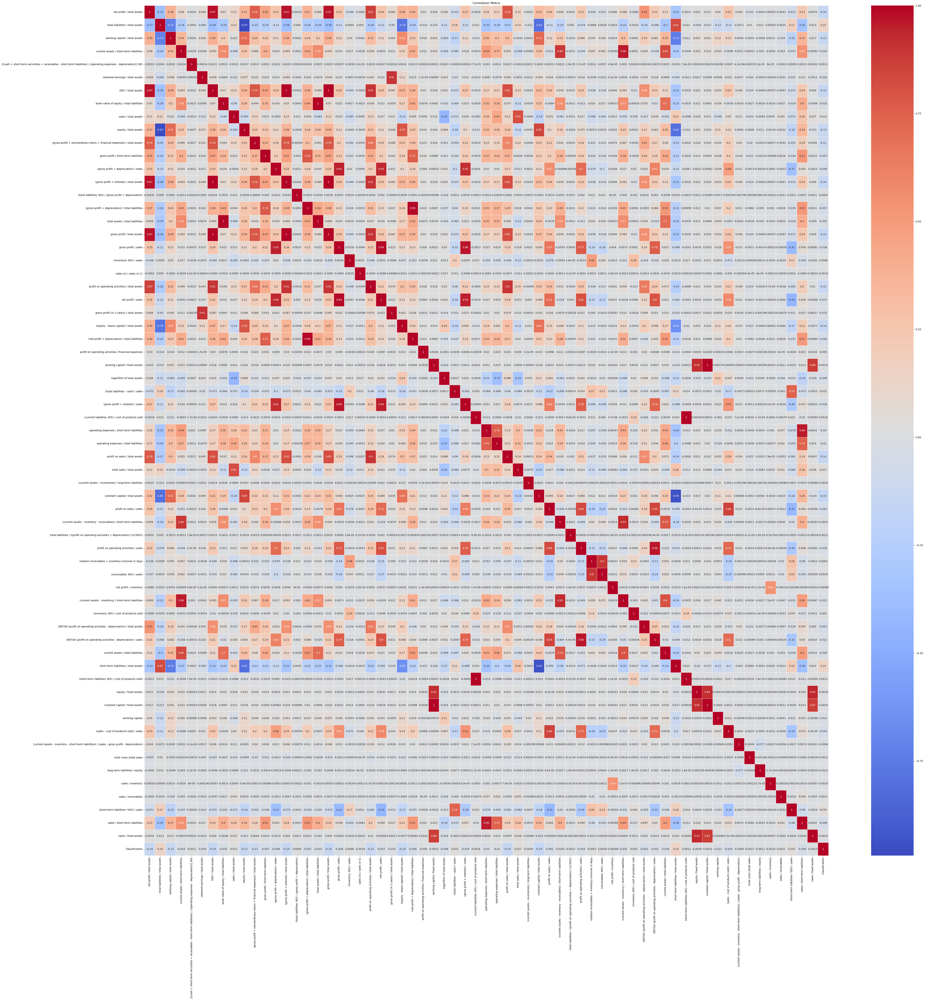

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with multiple numerical columns
# You can replace 'data' with your actual DataFrame

# Calculate the correlation matrix
correlation_matrix = merged_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(60, 60))

# Create a heatmap using the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)

# Show the plot
plt.title("Correlation Matrix")
plt.show()


With the filtered columns

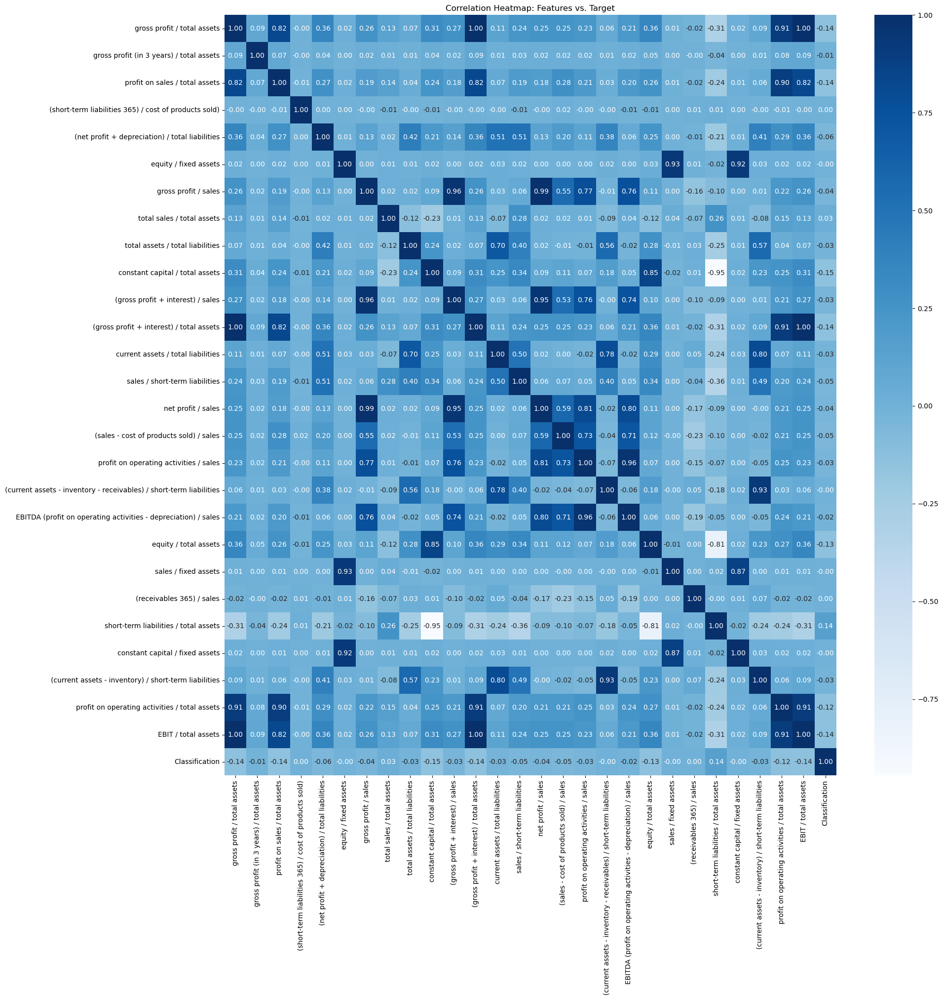

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'df' with columns 'feature1', 'feature2', ..., 'featureN', and 'target'

# Select the columns of interest (features and target)
features = ['gross profit / total assets',
       'gross profit (in 3 years) / total assets',
       'profit on sales / total assets',
       '(short-term liabilities 365) / cost of products sold)',
       '(net profit + depreciation) / total liabilities',
       'equity / fixed assets', 'gross profit / sales',
       'total sales / total assets', 'total assets / total liabilities',
       'constant capital / total assets', '(gross profit + interest) / sales',
       '(gross profit + interest) / total assets',
       'current assets / total liabilities', 'sales / short-term liabilities',
       'net profit / sales', '(sales - cost of products sold) / sales',
       'profit on operating activities / sales',
       '(current assets - inventory - receivables) / short-term liabilities',
       'EBITDA (profit on operating activities - depreciation) / sales',
       'equity / total assets', 'sales / fixed assets',
       '(receivables 365) / sales', 'short-term liabilities / total assets',
       'constant capital / fixed assets',
       '(current assets - inventory) / short-term liabilities',
       'profit on operating activities / total assets', 'EBIT / total assets'] # Add more feature columns as needed
target = 'Classification'

# Create a new DataFrame with only the selected columns
data_subset = merged_df[features + [target]]

# Calculate the correlation matrix
correlation_matrix = data_subset.corr()

# Create a heatmap for the correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f")
plt.title("Correlation Heatmap: Features vs. Target")
plt.show()



filtered_data: dataframe whose number of columns are 27, after removing columns that are below certain threshold (0.8)
merged_df: original dataframe with 65 columns, including the target variable

**PCA**

Goal: The main goal of PCA is to reduce the number of dimensions (features) of a dataset while preserving its essential characteristics and minimizing information loss.


Make a copy of the dataframe into a new one

In [34]:
import pandas as pd

# Assuming 'original_df' is your original DataFrame
new_df = filtered_data.copy()


In [35]:
import pandas as pd

# Assuming 'original_df' is your original DataFrame
new_data = merged_df.copy()

PCA steps

1- STANDARDIZATION

Mathematically, this can be done by subtracting the mean and dividing by the standard deviation for each value of each variable.

In [36]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming 'data' is your dataset with rows as samples and columns as features

# Step 1: Initialize the StandardScaler
scaler = StandardScaler()

# Step 2: Fit and transform the data
scaled_data = scaler.fit_transform(new_df)

# Now 'scaled_data' contains your standardized data


For merged_df

In [37]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming 'data' is your dataset with rows as samples and columns as features

# Step 1: Initialize the StandardScaler
scaler = StandardScaler()

# Step 2: Fit and transform the data
scaled_data1 = scaler.fit_transform(new_data)

# Now 'scaled_data' contains your standardized data

2- COVARIANCE MATRIX COMPUTATION

It’s actually the sign of the covariance that matters:
If positive then: the two variables increase or decrease together (correlated)
If negative then: one increases when the other decreases (Inversely correlated)

In [38]:
import numpy as np


covariance_matrix = np.cov(scaled_data, rowvar=False)


For merged_df

In [39]:
import numpy as np


covariance_matrix1 = np.cov(scaled_data1, rowvar=False)

In [40]:
covariance_matrix

array([[ 1.00002453e+00,  9.63166671e-01,  1.76610154e-01,
        -2.80322435e-03,  7.43179692e-01,  2.69021616e-01,
         9.53632619e-01,  1.42594054e-01,  3.20185630e-02,
         5.67198740e-02, -8.03612773e-04,  1.09964495e-02,
        -9.92894849e-02,  7.49663300e-03,  2.34155472e-02,
        -8.83983793e-02,  2.69021618e-01,  5.29625142e-01,
         2.08461289e-01,  2.32961632e-02,  2.06921054e-03,
         1.03603847e-01,  7.56298318e-01,  8.58715605e-02,
         1.47303429e-04,  2.69021616e-01,  2.92635807e-03],
       [ 9.63166671e-01,  1.00002453e+00,  1.86639992e-01,
        -5.94489320e-03,  7.63331069e-01,  2.57424702e-01,
         9.90967413e-01,  1.29315060e-01,  3.08866075e-02,
         5.83288743e-02, -4.06401016e-03,  7.25636502e-03,
        -1.57385644e-01,  1.80124356e-02,  2.34948355e-02,
        -9.60376683e-02,  2.57424703e-01,  5.48609797e-01,
         2.19183964e-01,  2.28031213e-02,  2.17436288e-03,
         1.14693974e-01,  7.72538962e-01,  9.27003544e-

For merged_df

In [41]:
covariance_matrix1

array([[ 1.00002453, -0.37442725,  0.37703515, ...,  0.2296504 ,
         0.00783007, -0.14229685],
       [-0.37442725,  1.00002453, -0.71806525, ..., -0.34506646,
         0.01259159,  0.13639806],
       [ 0.37703515, -0.71806525,  1.00002453, ...,  0.36726361,
         0.01703954, -0.13427256],
       ...,
       [ 0.2296504 , -0.34506646,  0.36726361, ...,  1.00002453,
         0.0041801 , -0.04754726],
       [ 0.00783007,  0.01259159,  0.01703954, ...,  0.0041801 ,
         1.00002453, -0.00147659],
       [-0.14229685,  0.13639806, -0.13427256, ..., -0.04754726,
        -0.00147659,  1.00002453]])

3- COMPUTE THE EIGENVECTORS AND EIGENVALUES OF THE COVARIANCE MATRIX TO IDENTIFY THE PRINCIPAL COMPONENTS

Principal components are new variables that are constructed as linear combinations or mixtures of the initial variables.
These eigenvalues represent the amount of variance captured by each principal component. You can use these eigenvalues to calculate the explained variance ratio and decide how many principal components to retain for dimensionality reduction.

In [42]:
# Compute the eigenvalues and eigenvectors of the covariance matrix
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Sort eigenvalues and corresponding eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

# Print eigenvalues and eigenvectors
print("Eigenvalues:")
print(eigenvalues)
print("\nEigenvectors:")
print(eigenvectors)

Eigenvalues:
[ 6.74438128e+00  4.44335334e+00  3.23196310e+00  2.81787781e+00
  2.07670967e+00  1.15311754e+00  1.00125907e+00  9.90628595e-01
  9.41383640e-01  7.20128963e-01  6.55017447e-01  5.09212456e-01
  3.79945769e-01  2.73352081e-01  2.54641322e-01  2.04844205e-01
  1.63309521e-01  1.24934298e-01  6.56738581e-02  6.28324882e-02
  5.39953221e-02  4.93274748e-02  4.37825282e-02  3.29262791e-02
  6.06425285e-03  9.14298952e-12 -4.80579465e-17]

Eigenvectors:
[[ 2.42788071e-01  2.64260776e-01 -2.04666465e-01 -8.35778947e-03
   1.93917635e-03  1.05203825e-01  3.73250034e-02 -4.02855985e-03
  -1.62562631e-01 -2.02182849e-01 -2.73420142e-01  5.48821013e-02
  -3.92490049e-02  1.61617601e-01 -2.74014216e-02 -2.76356848e-05
   1.72565210e-02 -9.15864531e-04  2.14402311e-01 -3.63336536e-02
  -7.57657969e-02 -3.64102665e-01  6.69269562e-01 -2.12320154e-02
   9.49916960e-02 -1.17311819e-07  8.76170275e-13]
 [ 2.45958272e-01  2.71444624e-01 -2.10786611e-01 -8.73945597e-03
   8.82237180e-03  

For merged_df

In [43]:
# Compute the eigenvalues and eigenvectors of the covariance matrix
eigenvalues1, eigenvectors1 = np.linalg.eig(covariance_matrix1)

# Sort eigenvalues and corresponding eigenvectors in descending order
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues1 = eigenvalues1[sorted_indices]
eigenvectors1 = eigenvectors1[:, sorted_indices]

# Print eigenvalues and eigenvectors
print("Eigenvalues:")
print(eigenvalues1)
print("\nEigenvectors:")
print(eigenvectors1)


Eigenvalues:
[10.88716947  6.67764675  4.68178023  3.77237258  3.67765914  2.75397427
  2.13093602  2.03231768  1.88995995  1.55361148  1.54241683  1.32020829
  1.15289686  1.08131058  1.07550703  0.70343167  0.67018929  0.91857536
  0.92766878  0.96484158  1.01910751  0.97883275  0.98428527  1.00640561
  0.9941004   1.00252048  1.00295816]

Eigenvectors:
[[ 2.33524088e-01 -6.46745148e-02  2.33415305e-01 ... -9.50935909e-03
  -5.35046582e-03 -6.32080663e-04]
 [-1.91310723e-01 -1.00927326e-01 -4.52453961e-02 ...  1.71017792e-03
   1.73830978e-02  1.64073273e-02]
 [ 1.86313973e-01  9.54600727e-02  4.37105647e-02 ... -1.94963348e-02
   1.15603920e-02 -1.46089899e-02]
 ...
 [ 1.67999909e-01  1.75054372e-01 -9.79180366e-02 ... -2.47839515e-02
   5.92089368e-02  3.05633383e-02]
 [ 4.11626319e-03  4.16560489e-03  1.12267479e-02 ... -1.37194386e-04
  -3.47511367e-03  1.30989993e-04]
 [-4.84168718e-02  1.97189822e-03 -4.32296034e-02 ... -7.48212411e-02
   1.70117073e-01 -1.37489863e-01]]


4- FEATURE VECTOR

In [44]:
len(new_df.columns)

27

In [45]:
len(new_data.columns)

65

In [46]:
# Normalize eigenvalues to get explained variance ratio
explained_variance_ratio = eigenvalues / np.sum(eigenvalues)

# Calculate cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Choose the number of principal components to keep (at least 90% explained variance)
num_components_to_keep = np.argmax(cumulative_explained_variance >= 0.95) + 1

print(f"Number of Components to Keep for at least 95% Explained Variance: {num_components_to_keep}")

Number of Components to Keep for at least 95% Explained Variance: 13


For merged_df

In [47]:
# Normalize eigenvalues to get explained variance ratio
explained_variance_ratio = eigenvalues1 / np.sum(eigenvalues1)

# Calculate cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Choose the number of principal components to keep (at least 90% explained variance)
num_components_to_keep1 = np.argmax(cumulative_explained_variance >= 0.96) + 1

print(f"Number of Components to Keep for at least 95% Explained Variance: {num_components_to_keep}")

Number of Components to Keep for at least 95% Explained Variance: 13


5- RECAST THE DATA ALONG THE PRINCIPAL COMPONENTS AXES

the aim is to use the feature vector formed using the eigenvectors of the covariance matrix, to reorient the data from the original axes to the ones represented by the principal components (hence the name Principal Components Analysis).

In [48]:
# Step 6: Transform data using selected components
selected_eigenvectors = eigenvectors[:, :num_components_to_keep]
reduced_data = np.dot(scaled_data, selected_eigenvectors)

# Now 'reduced_data' contains your data with reduced dimensions

In [49]:
reduced_data

array([[ 1.59758348e+00,  2.53364488e-01,  1.13693459e+00, ...,
        -2.13790248e-02, -3.39423910e-02, -6.92547159e-02],
       [ 1.56314884e+00,  4.80521987e-01,  1.33414943e+00, ...,
         6.26067591e-03, -1.13995381e-01, -7.74294467e-02],
       [ 2.25368696e+00,  8.91910681e-01,  1.66074228e+00, ...,
         1.70578191e-01,  8.18727398e-03,  2.02206794e-01],
       ...,
       [-7.54480555e+00,  2.43748262e+00, -3.98109843e+00, ...,
        -9.60153622e-02,  2.13408798e-02, -4.51752109e-01],
       [-2.47154979e+00, -4.20521425e-02, -7.12774368e-01, ...,
        -3.30362394e-01,  3.90733319e-01,  6.22397905e-01],
       [-2.26115632e+00,  4.80269508e-01, -8.14705515e-01, ...,
        -6.90134178e-02, -2.38541369e-02, -1.16785715e-01]])

For merged_df

In [50]:
# Step 6: Transform data using selected components
selected_eigenvectors = eigenvectors1[:, :num_components_to_keep1]
reduced_data1 = np.dot(scaled_data1, selected_eigenvectors)

# Now 'reduced_data' contains your data with reduced dimensions

**Mutual Information Selection**

Make a copy of the dataframe into a new one

In [51]:
import pandas as pd

# Assuming 'original_df' is your original DataFrame
new_df1 = filtered_data.copy()

In [52]:
import pandas as pd

# Assuming 'original_df' is your original DataFrame
new_data1 = merged_df.copy()

Calculate Mutual Information for Each Feature: Compute the Mutual Information score between each feature and the target variable. Mutual Information measures the reduction in uncertainty of one variable given the knowledge of another variable. In this case, it measures how much knowing the value of a particular feature reduces the uncertainty about the target variable.

In [53]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif

# Separate the target variable and the features
X = new_df1
y = merged_df['Classification']

# Calculate Mutual Information scores
mi_scores = mutual_info_classif(X, y)

# Create a DataFrame to store the feature names and their corresponding MI scores
mi_df = pd.DataFrame({'Feature': X.columns, 'MI Score': mi_scores})

# Sort the DataFrame by MI Score in descending order
mi_df = mi_df.sort_values(by='MI Score', ascending=False)

# Print the result
print(mi_df)

                                              Feature  MI Score
22             profit on operating activities / sales  0.014757
18      profit on operating activities / total assets  0.013760
14           gross profit (in 3 years) / total assets  0.013709
7     (net profit + depreciation) / total liabilities  0.013676
11  (current assets - inventory) / short-term liab...  0.013233
6                                  net profit / sales  0.010618
1                                gross profit / sales  0.009970
25                        gross profit / total assets  0.009425
5            (gross profit + interest) / total assets  0.009412
16                                EBIT / total assets  0.009398
2                      profit on sales / total assets  0.009112
23                    constant capital / total assets  0.008390
15              short-term liabilities / total assets  0.008161
0                   (gross profit + interest) / sales  0.007830
20                    constant capital /

MI for the original dataframe not the filtered one

In [54]:
import pandas as pd
from sklearn.feature_selection import mutual_info_classif

# Separate the target variable and the features
X = new_data1.drop(columns=['Classification'])
y = merged_df['Classification']

# Calculate Mutual Information scores
mi_scores1 = mutual_info_classif(X, y)

# Create a DataFrame to store the feature names and their corresponding MI scores
mi_df1 = pd.DataFrame({'Feature': X.columns, 'MI Score': mi_scores1})

# Sort the DataFrame by MI Score in descending order
mi_df1 = mi_df1.sort_values(by='MI Score', ascending=False)

# Print the result
print(mi_df1)

                                              Feature  MI Score
26  profit on operating activities / financial exp...  0.028038
20                            sales (n) / sales (n-1)  0.016309
41             profit on operating activities / sales  0.014716
21      profit on operating activities / total assets  0.013718
23           gross profit (in 3 years) / total assets  0.013615
..                                                ...       ...
8                                sales / total assets  0.000677
36  (current assets - inventories) / long-term lia...  0.000119
43                          (receivables 365) / sales  0.000000
35                         total sales / total assets  0.000000
60                                sales / receivables  0.000000

[64 rows x 2 columns]


Select Top Features: Choose a predefined number of top features with the highest Mutual Information scores. Alternatively, you can set a threshold value and select features that have Mutual Information scores above that threshold.


Create New Dataset: Create a new dataset using only the selected features. This reduced dataset contains the most informative features according to their relationship with the target variable.

In [55]:
# Choose a threshold value
threshold = 0.005

# Select features with MI scores above the threshold
selected_features = mi_df[mi_df['MI Score'] > threshold]['Feature'].tolist()

# Create a new DataFrame with the selected features
selected_data = new_df1[selected_features]

# Print the selected features
print(selected_features)
selected_data


['profit on operating activities / sales', 'profit on operating activities / total assets', 'gross profit (in 3 years) / total assets', '(net profit + depreciation) / total liabilities', '(current assets - inventory) / short-term liabilities', 'net profit / sales', 'gross profit / sales', 'gross profit / total assets', '(gross profit + interest) / total assets', 'EBIT / total assets', 'profit on sales / total assets', 'constant capital / total assets', 'short-term liabilities / total assets', '(gross profit + interest) / sales', 'constant capital / fixed assets', 'equity / total assets', 'equity / fixed assets', 'total assets / total liabilities', '(current assets - inventory - receivables) / short-term liabilities', '(sales - cost of products sold) / sales', 'sales / short-term liabilities', 'current assets / total liabilities']


,profit on operating activities / sales,profit on operating activities / total assets,gross profit (in 3 years) / total assets,(net profit + depreciation) / total liabilities,(current assets - inventory) / short-term liabilities,net profit / sales,gross profit / sales,gross profit / total assets,(gross profit + interest) / total assets,EBIT / total assets,...,short-term liabilities / total assets,(gross profit + interest) / sales,constant capital / fixed assets,equity / total assets,equity / fixed assets,total assets / total liabilities,(current assets - inventory - receivables) / short-term liabilities,(sales - cost of products sold) / sales,sales / short-term liabilities,current assets / total liabilities
0,0.128040,0.214020,0.47706,0.604110,1.52250,0.119980,0.149420,0.249760,0.249760,0.249760,...,0.37854,0.149420,2.24800,0.504940,2.243700,2.6349,0.662950,0.121960,4.4158,2.04200
1,0.145950,0.248060,0.16448,0.439920,1.12520,0.123040,0.152000,0.258340,0.258340,0.258340,...,0.49988,0.152000,17.86600,0.497880,17.866000,2.0005,0.086422,0.121300,3.4000,1.94470
2,0.231170,0.302600,0.16448,0.372820,1.01010,0.189960,0.236100,0.309060,0.309060,0.309060,...,0.48152,0.238150,2.05040,0.304080,1.209800,1.4369,0.322020,0.241140,2.7185,1.07580
3,0.088995,0.115500,0.17193,0.361520,1.56960,0.062782,0.071428,0.092704,0.092704,0.092704,...,0.30734,0.071428,2.45240,0.573530,2.452400,3.2537,0.401390,0.054015,4.2228,2.49280
4,0.122310,0.198320,0.18732,0.322110,0.95787,0.115530,0.115530,0.187320,0.187320,0.187320,...,0.56511,0.115530,2.11840,0.386770,1.883900,1.6307,0.293040,0.134850,2.8692,1.29590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40763,-0.193090,-0.269220,-0.28338,-0.289770,0.41473,-0.203240,-0.203240,-0.283380,-0.283380,-0.283380,...,0.35655,-0.175650,0.74181,0.022018,0.028649,1.0226,0.016216,0.032555,3.9105,0.23663
40764,0.024093,0.040401,0.90184,0.054556,0.62061,0.007692,0.008338,0.013981,0.013981,0.013981,...,0.22564,0.024762,0.90248,0.293790,0.399440,1.4160,0.022858,0.020169,7.4313,0.37454
40765,-0.123990,-0.534920,-0.57805,-0.491730,0.12517,-0.133990,-0.133990,-0.578050,-0.578050,-0.578050,...,0.95997,-0.133990,-0.45546,-0.390040,-0.463850,1.0341,0.024771,-0.064073,4.4940,0.16455
40766,-0.129340,-0.099950,-0.10918,-0.067762,0.77157,-0.140860,-0.141280,-0.109180,-0.109180,-0.109180,...,0.17599,-0.141280,0.81772,0.093224,0.115300,1.3442,0.048976,-0.183200,4.3911,0.25733


MI from the reduced_data resulted from the PCA process

In [56]:
import pandas as pd

# Assuming 'original_df' is your original DataFrame
new_data2 = reduced_data.copy()

In [57]:
from sklearn.feature_selection import mutual_info_classif

# Calculate MI scores for reduced_data
mi_scores_reduced = mutual_info_classif(new_data2, merged_df['Classification'])
print(mi_scores_reduced)


[0.01226152 0.00732146 0.0034133  0.01034746 0.00400769 0.00192843
 0.00167935 0.00339187 0.00056547 0.0005689  0.00139208 0.
 0.00121362]


### NAIVE BAYES WITH MUTUAL INFORMATION 

In [58]:
X = selected_data 
y = merged_df['Classification'] 

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

classifier = GaussianNB()

# Train the Naive Bayes classifier
classifier.fit(X_train, y_train)

# Predict the target values on the test set
y_pred_mi = classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_mi)
conf_matrix = confusion_matrix(y_test, y_pred_mi)
classification_rep = classification_report(y_test, y_pred_mi)

# Print the evaluation results
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(classification_rep)


Accuracy: 0.83
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.85      0.90      7758
           1       0.11      0.35      0.17       396

    accuracy                           0.83      8154
   macro avg       0.54      0.60      0.53      8154
weighted avg       0.92      0.83      0.87      8154



### Checking percentage of test dataset 

In [59]:
# Calculate the count of non-bankrupt and bankrupt data
count_non_bankrupt = np.sum(y_test == 0)
count_bankrupt = np.sum(y_test == 1)

# Calculate the total number of samples in the test dataset
total_samples = len(y_test)

# Calculate the percentage
percentage_non_bankrupt = (count_non_bankrupt / total_samples) * 100
percentage_bankrupt = (count_bankrupt / total_samples) * 100

print(f'Percentage of Non-Bankrupt Data: {percentage_non_bankrupt:.2f}%')
print(f'Percentage of Bankrupt Data: {percentage_bankrupt:.2f}%')

Percentage of Non-Bankrupt Data: 95.14%
Percentage of Bankrupt Data: 4.86%


### NAIVE BAYES WITH PCA

In [60]:
X = reduced_data  # Features obtained from PCA
y = merged_df['Classification']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

classifier = GaussianNB()  

# Train the Naive Bayes classifier
classifier.fit(X_train, y_train)

# Predict the target values on the test set
y_pred_pca = classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_pca)
conf_matrix = confusion_matrix(y_test, y_pred_pca)
classification_rep = classification_report(y_test, y_pred_pca)

# Print the evaluation results
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(classification_rep)


Accuracy: 0.71
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.72      0.82      7758
           1       0.08      0.51      0.14       396

    accuracy                           0.71      8154
   macro avg       0.53      0.61      0.48      8154
weighted avg       0.92      0.71      0.79      8154



### CONFUSION MATRIX OF NAIVE BAYES WITH SEPARATE MI AND PCA

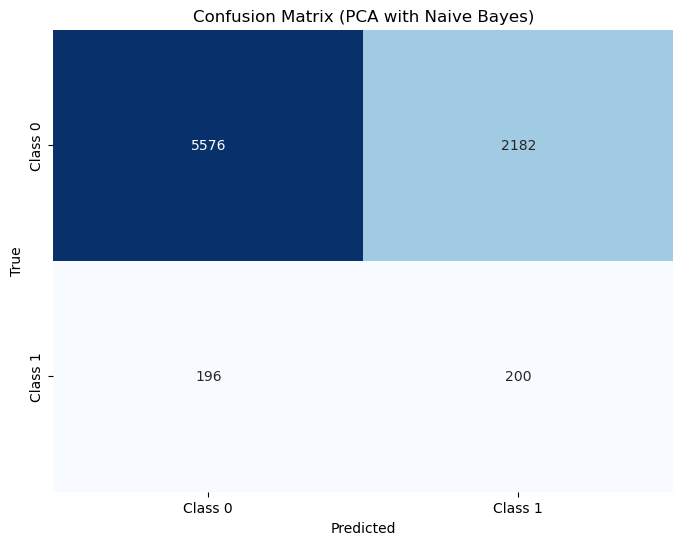

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming 'y_test' contains the true labels and 'y_pred_pca' contains the predicted labels for PCA with Naive Bayes

# Calculate the confusion matrix for PCA with Naive Bayes
conf_matrix_pca = confusion_matrix(y_test, y_pred_pca)

# Create a heatmap of the confusion matrix for PCA with Naive Bayes
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_pca, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (PCA with Naive Bayes)')
plt.show()


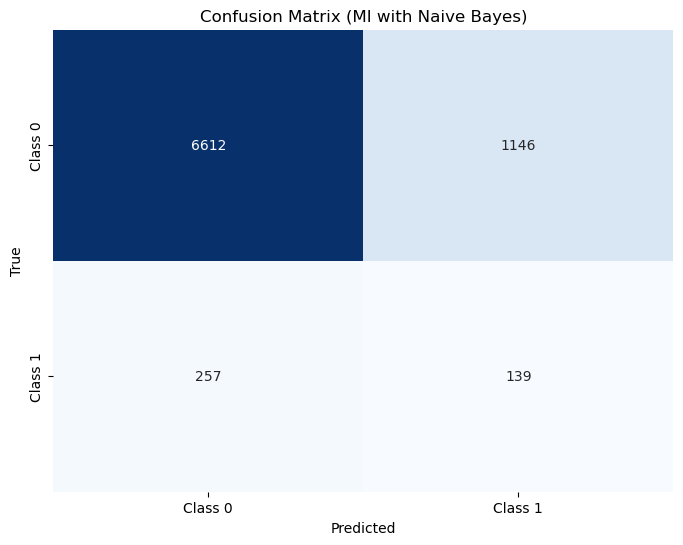

In [62]:
# Calculate the confusion matrix for MI with Naive Bayes
conf_matrix_mi = confusion_matrix(y_test, y_pred_mi)

# Create a heatmap of the confusion matrix for MI with Naive Bayes
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_mi, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (MI with Naive Bayes)')
plt.show()


### LOGISTIC REGRESSION WITH PCA

In [63]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(reduced_data, y, test_size=0.2, random_state=42)

# Standardize the features (important for Logistic Regression)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create and train the Logistic Regression model
logistic_model = LogisticRegression(random_state=42)
logistic_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_logPCA = logistic_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_logPCA)
print(f"Accuracy: {accuracy}")

# Evaluate the model
classification_rep = classification_report(y_test, y_pred_logPCA)

print("\nClassification Report:\n", classification_rep)


Accuracy: 0.9513122393917096

Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.98      7758
           1       0.46      0.02      0.03       396

    accuracy                           0.95      8154
   macro avg       0.71      0.51      0.50      8154
weighted avg       0.93      0.95      0.93      8154



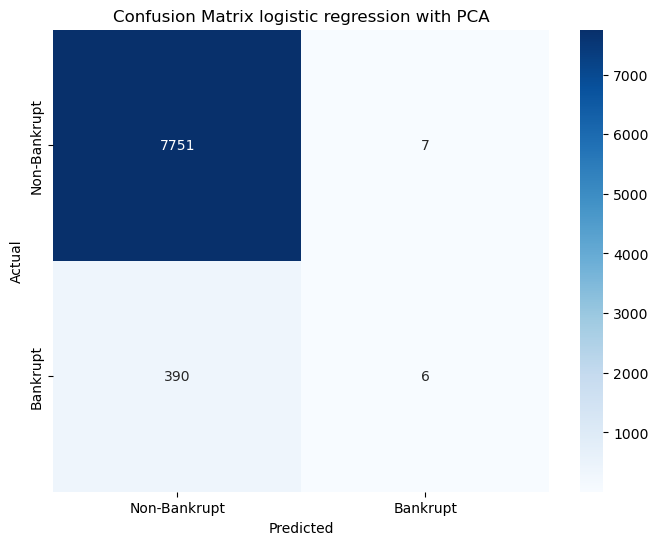

In [64]:
# Create a confusion matrix
confusion_logPCA = confusion_matrix(y_test, y_pred_logPCA)

# Define class labels (0 for non-bankrupt, 1 for bankrupt)
class_labels = ['Non-Bankrupt', 'Bankrupt']

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_logPCA, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix logistic regression with PCA')
plt.show()


### LOGISTIC REGRESSION WITH MUTUAL INFORMATION WITH DEFAULT SOLVER LBFGS

In [65]:
# Separate the target variable
X = selected_data
y = merged_df['Classification']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Logistic Regression model with the 'saga' solver
logistic_model = LogisticRegression(solver='lbfgs', random_state=42)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_logMI = logistic_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_logMI)
print(f"Accuracy: {accuracy}")

# Generate a classification report
report = classification_report(y_test, y_pred_logMI)
print("Classification Report:")
print(report)



Accuracy: 0.9509443218052489
Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      7758
           1       0.36      0.01      0.02       396

    accuracy                           0.95      8154
   macro avg       0.65      0.51      0.50      8154
weighted avg       0.92      0.95      0.93      8154



c:\Users\XGBoost\Anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


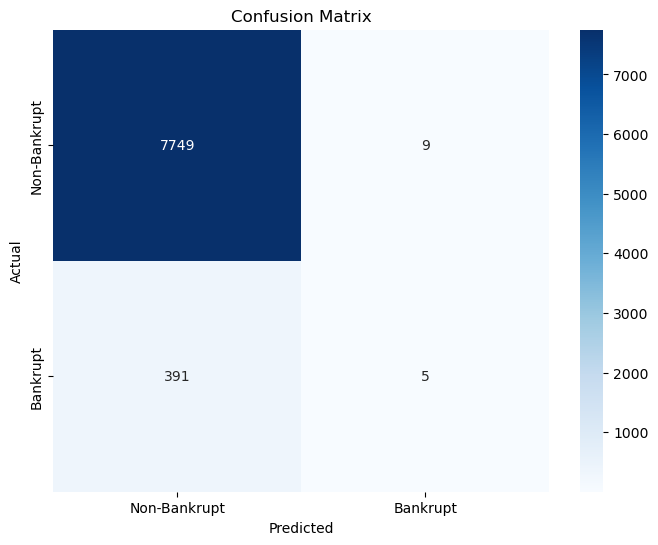

In [66]:
# Create a confusion matrix
confusion_logMI = confusion_matrix(y_test, y_pred_logMI)

# Define the class labels
class_names = ['Non-Bankrupt', 'Bankrupt']

# Create a Seaborn heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_logMI, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### LOGISTIC REGRESSION (SAG) WITH MUTUAL INFORMATION 

In [67]:
# Separate the target variable
X = selected_data
y = merged_df['Classification']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Logistic Regression model with the 'saga' solver
logistic_model = LogisticRegression(max_iter=500, solver='sag', random_state=42)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_logSagMI = logistic_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_logSagMI)
print(f"Accuracy: {accuracy}")

# Generate a classification report
report = classification_report(y_test, y_pred_logSagMI)
print("Classification Report:")
print(report)


Accuracy: 0.9483688987000245
Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      7758
           1       0.16      0.02      0.03       396

    accuracy                           0.95      8154
   macro avg       0.56      0.51      0.50      8154
weighted avg       0.91      0.95      0.93      8154



c:\Users\XGBoost\Anaconda3\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


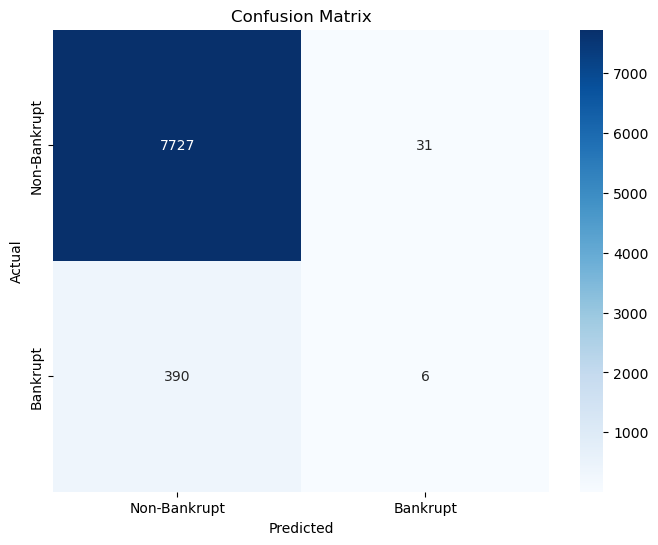

In [68]:
# Create a confusion matrix
confusion_logSagMI = confusion_matrix(y_test, y_pred_logSagMI)

# Define the class labels
class_names = ['Non-Bankrupt', 'Bankrupt']

# Create a Seaborn heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_logSagMI, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### LOGISTIC REGRESSION USING NEWTON CG SOLVER WITH MUTUAL INFORMATION 

Accuracy: 0.9504537650233015
              precision    recall  f1-score   support

Non-Bankrupt       0.95      1.00      0.97      7758
    Bankrupt       0.21      0.01      0.01       396

    accuracy                           0.95      8154
   macro avg       0.58      0.50      0.49      8154
weighted avg       0.92      0.95      0.93      8154



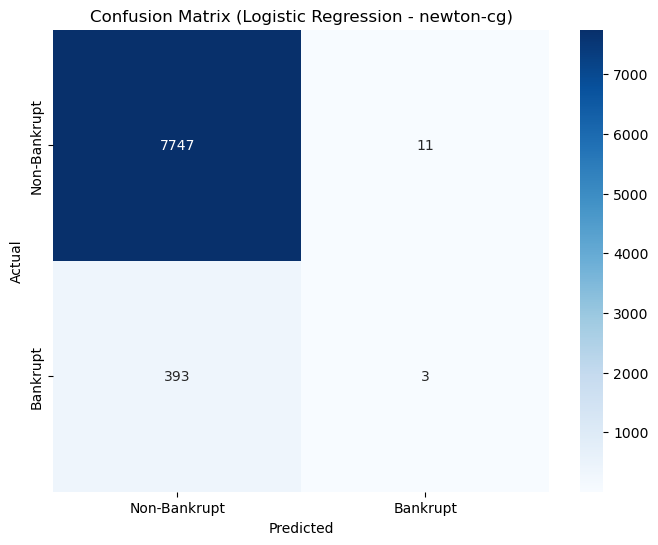

In [70]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Logistic Regression model with 'newton-cg' solver
logistic_model = LogisticRegression(max_iter=100, solver='newton-cg', random_state=42)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_logNewtonMI = logistic_model.predict(X_test)

# Define class names
class_names = ['Non-Bankrupt', 'Bankrupt']

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_logNewtonMI)
print(f"Accuracy: {accuracy}")

# Print a classification report
print(classification_report(y_test, y_pred_logNewtonMI, target_names=class_names))

# Create a confusion matrix
confusion_logNewtonMI = confusion_matrix(y_test, y_pred_logNewtonMI)

# Create a Seaborn heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_logNewtonMI, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Logistic Regression - newton-cg)')
plt.show()

